In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))


# The study of the results of running the algorithm on transfermarket-2008_2023 dataset: <br>

`input_directory`:  `data/input/real_data/transfermarket`<br>
`output_directory`: `data/output/5-fold_cv/real_data/transfermarket`<br>
`input_file`:       `adjacency_2008_23_len.dat` which contains the transfer data from 2008 to 2023 in 5 time snapshots<br>
`input`:            "`theta_adjacency_2008_23_len_K8_cv.npz`"  contains the community membership resulting from the MT algorithm. <br>
**`K`: The number of communities (8) is determined from the cross-validation results of the MT algorithm.** 


## IMPORTANT NOTES: <br>

There are three notebooks with the names startet with: "Dyn_ACD_CS_transfermarket-2008_2023_K8-cdebacco" <br>

1- The notebook with the old results, Milan and Inter were mixed, without including the missing nodes and edges. The network has **251** nodes: the notebook is named: **Dyn_ACD_CS_transfermarket-2008_2023_K8-cdebacco-251nd.ipynb** <br>
2- The notebook with the results from new datasets; however, **Milan and Inter are still mixed**, including missing nodes and edges. The network has **261** nodes: the notebook is named: **Dyn_ACD_CS_transfermarket-2008_2023_K8-cdebacco-MM.ipynb** <br>
3- The notebook with the results from new datasets,**Milan and Inter are separated**, including missing nodes and edges. The network has **262** nodes: the notebook (this one) is named: **Dyn_ACD_CS_transfermarket-2008_2023_K8-cdebacco.ipynb** <br>

In [3]:
import sys
sys.path.append('../')
from src.analyze_transfermarkt import transfermarkt_utils as ttl
# sys.path.append('../Dyn_ACD')

import Dyn_ACD as DynACD 

import networkx as nx
import pandas as pd
import os

import numpy as np   
import random as rdm
import importlib
import matplotlib.pyplot as plt

from collections import defaultdict
import json

import seaborn as sns 
sns.set_theme()
sns.set_style("ticks") 
%matplotlib inline

In [4]:
pd.set_option('display.max_rows', 150)

In [5]:
sns.set_theme()
sns.axes_style('white')
# sns.set_theme(style="whitegrid", palette="pastel")
# sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
custom_params = {"axes.spines.right": True, "axes.spines.top": True}
sns.set_theme(style="ticks", rc=custom_params, font_scale=1.0, palette="tab20") 
# palette_colors = {"Regular": "green", "Anomalous": "blue"}

# sns.set_palette("RdBu")
sns.set_context("talk")# Option: "paper","notebook","talk","poster",the later the bigger.
sns.set_theme(style="ticks", rc={"font.size": 26, "font.family": ['sans-serif'], "font.sans-serif": ['Helvetica']})

# Import metadata

In [6]:
# df_meta[df_meta.lat.isna()]

In [7]:
df_meta = ttl.import_metadata()
df_meta.head(n=10)

,node,fee_spent,fee_received,spent_over_received,team_city,coordinates,lat,lon
0,Manchester_City,4093.0,1468.0,2.788147,Manchester,"[53.4839, -2.2446]",53.4839,-2.2446
1,Chelsea,2335.0,1070.0,2.182243,London,"[51.5099, -0.118]",51.5099,-0.1180
2,Barcelona,1968.0,1102.0,1.785844,Barcelona,"[41.3851, 2.1734]",41.3851,2.1734
3,Juventus,1755.0,1083.0,1.620499,Turin,"[45.0703, 7.6869]",45.0703,7.6869
4,Real_Madrid,1718.0,1326.0,1.295626,Madrid,"[40.4168, -3.7038]",40.4168,-3.7038
5,PSG,1612.0,536.0,3.007463,Paris,"[48.8566, 2.3522]",48.8566,2.3522
6,Liverpool,1410.0,925.0,1.524324,Liverpool,"[53.4084, -2.9916]",53.4084,-2.9916
7,Arsenal,1326.0,562.0,2.359431,London,"[51.5099, -0.118]",51.5099,-0.1180
8,Tottenham,1217.0,726.0,1.676309,London,"[51.5099, -0.118]",51.5099,-0.1180
9,Inter_Milan,1210.0,876.0,1.381279,Milan,"[45.4642, 9.19]",45.4642,9.1900


### Plot in and out transfer fees

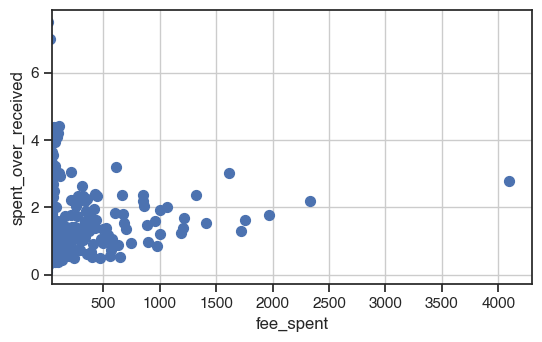

In [11]:
plt.figure(figsize=(6, 4))

x = 'fee_spent'
y = 'spent_over_received'
plt.scatter(df_meta[x],df_meta[y], marker='o', s=50)
plt.xlabel(x)
plt.ylabel(y)
plt.xlim(50,plt.xlim()[-1])
plt.grid(True)

plt.tight_layout()
plt.show()

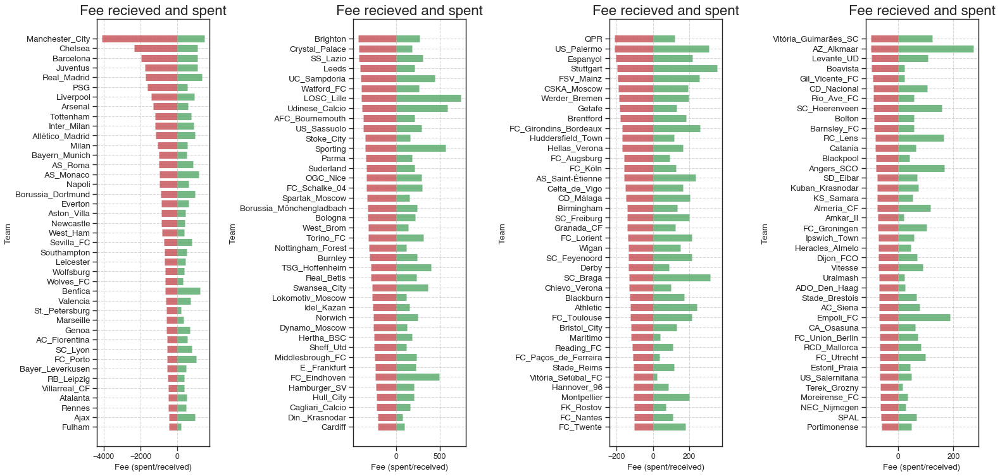

In [14]:
# Draw Plot
L = 4
alpha = 0.8
lw = 10
n_max = 40
plt.figure(figsize=(20,10), dpi= 80)

plt.subplot(1,L,1)

plt.hlines(y=df_meta.index[:n_max+1], xmin=-df_meta.fee_spent.iloc[n_max::-1], xmax=0, color='r', alpha=alpha, linewidth=lw)
plt.hlines(y=df_meta.index[:n_max+1], xmin=0, xmax=df_meta.fee_received.iloc[n_max::-1], color='g', alpha=alpha, linewidth=lw)

# Decorations
plt.gca().set(ylabel='Team', xlabel='Fee (spent/received)')
plt.yticks(df_meta.index[:n_max+1], df_meta.node.iloc[n_max::-1], fontsize=12)
plt.title('Fee recieved and spent', fontdict={'size':20})
plt.grid(linestyle='--', alpha=alpha)


plt.subplot(1,L,2)

n_2 = 40
plt.hlines(y=df_meta.index[n_2:n_2 + n_max], xmin=-df_meta.fee_spent.iloc[n_2 + n_max:n_2:-1], xmax=0, color='r', alpha=alpha, linewidth=lw)
plt.hlines(y=df_meta.index[n_2:n_2 + n_max], xmin=0, xmax=df_meta.fee_received.iloc[n_2 + n_max:n_2:-1], color='g', alpha=alpha, linewidth=lw)

# Decorations
plt.gca().set(ylabel='Team', xlabel='Fee (spent/received)')
plt.yticks(df_meta.index[n_2:n_2 + n_max], df_meta.node.iloc[n_2 + n_max:n_2:-1], fontsize=12)
plt.title('Fee recieved and spent', fontdict={'size':20})
plt.grid(linestyle='--', alpha=alpha)

plt.subplot(1,L,3)

n_2 = 80
plt.hlines(y=df_meta.index[n_2:n_2 + n_max], xmin=-df_meta.fee_spent.iloc[n_2 + n_max:n_2:-1], xmax=0, color='r', alpha=alpha, linewidth=lw)
plt.hlines(y=df_meta.index[n_2:n_2 + n_max], xmin=0, xmax=df_meta.fee_received.iloc[n_2 + n_max:n_2:-1], color='g', alpha=alpha, linewidth=lw)

# Decorations
plt.gca().set(ylabel='Team', xlabel='Fee (spent/received)')
plt.yticks(df_meta.index[n_2:n_2 + n_max], df_meta.node.iloc[n_2 + n_max:n_2:-1], fontsize=12)
plt.title('Fee recieved and spent', fontdict={'size':20})
plt.grid(linestyle='--', alpha=alpha)

plt.subplot(1,L,4)

n_2 = 120
plt.hlines(y=df_meta.index[n_2:n_2 + n_max], xmin=-df_meta.fee_spent.iloc[n_2 + n_max:n_2:-1], xmax=0, color='r', alpha=alpha, linewidth=lw)
plt.hlines(y=df_meta.index[n_2:n_2 + n_max], xmin=0, xmax=df_meta.fee_received.iloc[n_2 + n_max:n_2:-1], color='g', alpha=alpha, linewidth=lw)

# Decorations
plt.gca().set(ylabel='Team', xlabel='Fee (spent/received)')
plt.yticks(df_meta.index[n_2:n_2 + n_max], df_meta.node.iloc[n_2 + n_max:n_2:-1], fontsize=12)
plt.title('Fee recieved and spent', fontdict={'size':20})
plt.grid(linestyle='--', alpha=alpha)



plt.tight_layout()
plt.show()


### Import network data

In [15]:
df = ttl.import_network(suff_ad = '_binary')

### Inferred params

In [16]:
theta_gt_uv = ttl.import_inferred_params()

K = theta_gt_uv['u'].shape[1] 
N = theta_gt_uv['u'].shape[0]

ug_nr = DynACD.cv_functions.normalize_nonzero_membership(theta_gt_uv['u'])
vg_nr = DynACD.cv_functions.normalize_nonzero_membership(theta_gt_uv['v']) 

list(theta_gt_uv.keys()),theta_gt_uv['u'].shape

(['u', 'v', 'w', 'max_it', 'nodes', 'maxL'], (261, 8))

## Load the dataset

In [17]:
dir_out0 = '../data/output/5-fold_cv/'
dir_out1 = f"{dir_out0}real_data/transfermarket/"

if not os.path.exists(dir_out1):
    os.makedirs(dir_out1) 

# G1 = nx.Graph(G[0])  
infolder = '../data/input/real_data/transfermarket/'
dataset = 'adjacency_2008_23_binary'
end_file = '.dat'
'==============================================================='
network = f"{infolder}{dataset}{end_file}"
print('='*35)
print('network:', network)
'==============================================================='
#building the anomalous graph/matrix 
A_0, B_0, B_T_0, data_T_vals_0 = DynACD.tools_temp.import_data(network, ego='source', alter='target',force_dense=True, header=0, sep='\s+', binary= False) #\s+
nodes = A_0[0].nodes()
pos = nx.spring_layout(A_0[0]) 
N = len(nodes)
L = B_0.shape[0]
B_train_0 = B_0.copy()  
mask_input = None

T = B_0.shape[0]
# T = 3
T_f = T-1
B_train = B_0[:T]
print(B_train.shape, B_0.shape, T)

network: ../data/input/real_data/transfermarket/adjacency_2008_23_binary.dat
       source          target  weight_t0  weight_t1  weight_t2  weight_t3  \
0  AC_Ajaccio  Stade_Brestois          0          0          0          0   
1  AC_Ajaccio      FC_Lorient          0          0          0          0   
2  AC_Ajaccio       CA_Bastia          0          1          0          0   
3   AC_Amiens          Fulham          0          0          0          1   
4   AC_Amiens       Newcastle          0          0          0          1   

   weight_t4  
0          1  
1          1  
2          0  
3          0  
4          0  
../data/input/real_data/transfermarket/adjacency_2008_23_binary.dat shape: (5740, 7)


/Users/cdebacco/Dyn_ACD/notebooks_RD/../Dyn_ACD/tools_temp.py:108: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if row[l + 2] > 0:
/Users/cdebacco/Dyn_ACD/notebooks_RD/../Dyn_ACD/tools_temp.py:118: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  A[l].add_edge(v1, v2, weight=int(row[l + 2]))


Number of nodes = 261
Number of layers = 5
Number of edges and average degree in each layer:
E[0] = 1335 - <k> = 10.23
M[0] = 1335 - <k_weighted> = 10.23
Reciprocity (networkX) = 0.277
Reciprocity (intended as the proportion of bi-directional edges over the unordered pairs) = 0.161
Reciprocity (considering the weights of the edges) = 0.277
E[1] = 1557 - <k> = 11.931
M[1] = 1557 - <k_weighted> = 11.931
Reciprocity (networkX) = 0.239
Reciprocity (intended as the proportion of bi-directional edges over the unordered pairs) = 0.136
Reciprocity (considering the weights of the edges) = 0.239
E[2] = 1692 - <k> = 12.966
M[2] = 1692 - <k_weighted> = 12.966
Reciprocity (networkX) = 0.229
Reciprocity (intended as the proportion of bi-directional edges over the unordered pairs) = 0.13
Reciprocity (considering the weights of the edges) = 0.229
E[3] = 1581 - <k> = 12.115
M[3] = 1581 - <k_weighted> = 12.115
Reciprocity (networkX) = 0.215
Reciprocity (intended as the proportion of bi-directional edges

In [18]:
assert N == A_0[0].number_of_nodes()

In [19]:
for i in range(L):
    print('='*15)
    print('Time Step:', i)
    print("Number of non-zeros:", np.count_nonzero(B_0[i]))

Time Step: 0
Number of non-zeros: 1335
Time Step: 1
Number of non-zeros: 1557
Time Step: 2
Number of non-zeros: 1692
Time Step: 3
Number of non-zeros: 1581
Time Step: 4
Number of non-zeros: 1448


# `Dyn_CD`, i.e., `Dyn_ACD` with `flag_anomaly == False`

In [20]:
theta_cd, theta_cd_file = ttl.import_inferred_params_cd(flag_anomaly=False,suff_ad = '_binary')
list(theta_cd.keys())

['u', 'v', 'w', 'beta', 'max_it', 'pi', 'mu', 'phi', 'ell', 'maxL', 'nodes']

In [21]:
theta_cd_file

'../data/output/5-fold_cv/real_data/transfermarket/theta_adjacency_2008_23_binary_8_False_ACD_Wdynamic.npz'

In [22]:

if not os.path.exists(theta_cd_file):
    
    pibr0 = 0
    mupr0 = 0
    flag_anomaly = False 
    mask_input = None

    print(f"{theta_cd_file} does not exist")
    N_real = 10
    max_iter = 1000 
    flag_anomaly = False  
    rseed = 10
    initialization = 0
    labels = str(flag_anomaly) + 'ACD'

    beta0  = 0.7
    phi0   = 1
    ell0   = 0
    mupr0  = 0
    pibr0  = 0
    
    in_parameters = f"{infolder}theta_{dataset}_K{K}_MT"
    model = DynACD.Dyn_ACD_wtemp.Dyn_ACD_wtemp(K = K,N = N, plot_loglik=True,verbose =2,N_real= N_real,
                             undirected=False,flag_anomaly = flag_anomaly,max_iter = max_iter,
                             fix_mupr=True,fix_pibr = True,fix_phi = True,out_inference=True,
                             fix_beta=False,fix_ell=True,fix_communities=False,fix_w= False,
                             beta0 = beta0,phi0 = phi0, ell0= ell0, pibr0 = pibr0, mupr0= mupr0,
                             initialization=initialization,out_folder=dir_out1,
                             in_parameters=in_parameters, 
                             end_file = f"{pref_ad}{time_span}{suff_ad}_{flag_anomaly}_ACD_Wdynamic_K{K}",constrained=False, ag=1.0,bg=0.,L=T_f)


    u_an_0, v_an_0, w_an_0, beta_an_0, phi_an_0, ell_an_0, pi_an_0, mu_an_0,maxL_an_0 = model.fit(data=B_train,T=T_f, nodes=nodes) 
else:
    print(f"Initialisation from {theta_cd_file}")
    theta_cd = np.load(theta_cd_file)
    u_an_0, v_an_0, w_an_0 = theta_cd['u'], theta_cd['v'], theta_cd['w']
    pi_an_0, mu_an_0 = theta_cd['pi'], theta_cd['mu']
    beta_an_0, maxL_an_0 = theta_cd['beta'], theta_cd['max_it']

#acd on data (anomaly_flag=F)
u_an_0_n = DynACD.cv_functions.normalize_nonzero_membership(u_an_0)
v_an_0_n = DynACD.cv_functions.normalize_nonzero_membership(v_an_0)

_, cs_u_0 = DynACD.cv_functions.cosine_similarity(u_an_0_n,ug_nr)
_, cs_v_0 = DynACD.cv_functions.cosine_similarity(v_an_0_n,vg_nr)
print(f'MT vs CD cos similarity: {cs_u_0:.2f}, {cs_v_0:.2f}')

Initialisation from ../data/output/5-fold_cv/real_data/transfermarket/theta_adjacency_2008_23_binary_8_False_ACD_Wdynamic.npz
MT vs CD cos similarity: 0.68, 0.69


## `Dyn_ACD` with `flag_anomaly = True`

In [23]:
flag_anomaly = True
theta_acd, theta_acd_file = ttl.import_inferred_params_cd(flag_anomaly=flag_anomaly)
theta_acd_file

'../data/output/5-fold_cv/real_data/transfermarket/theta_adjacency_2008_23_binary_8_True_ACD_Wdynamic.npz'

In [24]:
# if os.path.exists(theta_acd_file):
#     os.remove(theta_acd_file)

In [25]:
theta_acd_file

'../data/output/5-fold_cv/real_data/transfermarket/theta_adjacency_2008_23_binary_8_True_ACD_Wdynamic.npz'

In [26]:
if not os.path.exists(theta_acd_file):
    print(f"{theta_acd_file} does not exist")
    N_real = 1
    max_iter = 200  
    rseed = 10
    initialization = 1
    labels = f'_{flag_anomaly}ACD'
#     beta0  = 0.8
#     phi0   = 0.7
#     ell0   = 0.1
#     mupr0  = 0.05
#     pibr0  = 0.1
    
#                              beta0 = beta0,phi0 = phi0, ell0= ell0, pibr0 = pibr0, mupr0= mupr0,
#     beta0 = beta0,phi0 = phi0, ell0= ell0, pibr0 = pibr0, mupr0= mupr0,
#                              
    in_parameters_acd = theta_cd_file.split('.npz')[0]
    
    model = DynACD.Dyn_ACD_wtemp.Dyn_ACD_wtemp(K = K,N = N, plot_loglik=True,verbose =2,N_real= N_real,
                             undirected=False,flag_anomaly = flag_anomaly,max_iter = max_iter,
                             fix_mupr=False,fix_pibr = False,fix_phi = False,out_inference=True,
                             fix_beta=False,fix_ell=False,fix_communities=False,fix_w= False,
                             out_folder= dir_out1,
                             initialization=initialization, 
                             in_parameters=in_parameters_acd, 
                             end_file = f"{pref_ad}{time_span}{suff_ad}_{flag_anomaly}_ACD_Wdynamic_K{K}",L=T_f)


    u_an, v_an, w_an, beta_an, phi_an, ell_an, pi_an, mu_an,maxL_an = model.fit(data=B_train,T=T_f, nodes=nodes)
else:
    print(f"Initialisation from {theta_acd_file}")
    theta_acd = np.load(theta_acd_file)
    u_an, v_an, w_an = theta_acd['u'],theta_acd['v'],theta_acd['w']
    pi_an,mu_an= theta_acd['pi'], theta_acd['mu']
    beta_an, phi_an, ell_an= theta_acd['beta'], theta_acd['phi'], theta_acd['ell']
    maxL_an= theta_acd['max_it']

print(pd.DataFrame([[f"{beta_an[0]:.2f}", f"{phi_an:.2f}", f"{ell_an:.2f}", f"{pi_an:.2f}", f"{mu_an:.4f}"]], columns = ['beta','phi','l','pi','mu']))

u_an_n = DynACD.cv_functions.normalize_nonzero_membership(u_an)
v_an_n = DynACD.cv_functions.normalize_nonzero_membership(v_an)

_, cs_u_an_0 = DynACD.cv_functions.cosine_similarity(u_an_n,u_an_0_n)
_, cs_v_an_0 = DynACD.cv_functions.cosine_similarity(v_an_n,v_an_0_n)
print(f'\nCD vs ACD cos simiarity: {cs_u_an_0:.2f}, {cs_v_an_0:.2f}')

_, cs_u_an_g = DynACD.cv_functions.cosine_similarity(u_an_n,ug_nr)
_, cs_v_an_g = DynACD.cv_functions.cosine_similarity(v_an_n,vg_nr)
print(f'MT vs ACD cos simiarity: {cs_u_an_g:.2f}, {cs_v_an_g:.2f}')

Initialisation from ../data/output/5-fold_cv/real_data/transfermarket/theta_adjacency_2008_23_binary_8_True_ACD_Wdynamic.npz
   beta   phi     l    pi      mu
0  0.81  0.21  0.60  0.40  0.0003

CD vs ACD cos simiarity: 0.96, 0.96
MT vs ACD cos simiarity: 0.75, 0.72


In [27]:
M0 = DynACD.cv_functions._lambda0_full(u_an, v_an, w_an[1:])
M00 = DynACD.cv_functions._lambda0_full(u_an, v_an, (w_an[0])[np.newaxis])
M = DynACD.cv_functions.calculate_conditional_expectation(M0[-1], beta=beta_an)
print(f"AUC ACD last time step: {DynACD.cv_functions.calculate_AUC(M, B_0[T-1]):.2f}")
# M_f = DynACD.cv_functions._lambda0_full(model.u_f,model.v_f,model.w_f)  

AUC ACD last time step: 0.91


In [28]:
M0.shape

(4, 261, 261)

In [29]:
if flag_anomaly:
    QIJ_dense = DynACD.cv_functions.QIJ_dense(B_train,(B_0[0])[np.newaxis,:,:],M0,M00,T_f, beta=beta_an, phi=phi_an, ell=ell_an,pi=pi_an, mu=mu_an,EPS=1e-12) 

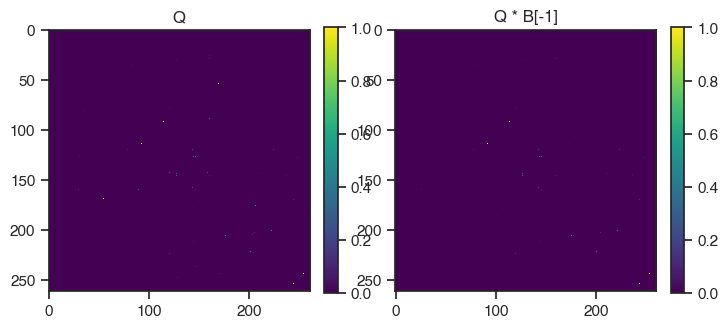

In [30]:
if flag_anomaly:
    mask_tmp = np.zeros(B_0[T_f].shape)
    mask_tmp[B_0[T_f] > 0] = 1 
    
    plt.figure(figsize=(8.2,4))
    plt.subplot(1, 2, 1)
    cmap = 'viridis'
    plt.imshow(QIJ_dense, cmap=cmap, interpolation='nearest')
    # plt.imshow(B[0], cmap=cmap, interpolation='nearest')
    plt.colorbar(fraction=0.046)
    plt.title('Q')


    plt.subplot(1, 2, 2) 
    plt.imshow(QIJ_dense*mask_tmp, cmap=cmap, interpolation='nearest') #values of Q at entries of B
    plt.colorbar(fraction=0.046)
    plt.title('Q * B[-1]') 


    plt.show()

In [31]:
subs_nzp =  B_0[T_f].nonzero()
if T>1:
    if flag_anomaly: 
        M_an = DynACD.cv_functions.calculate_conditional_expectation_Q(M0[-1], QIJ_dense, beta=beta_an, phi=phi_an, ell=ell_an)
        M_an[subs_nzp] = (1-QIJ_dense)[subs_nzp] * (1 - beta_an) + QIJ_dense[subs_nzp] * (1 - phi_an)# to calculate AUC
        # M_an = (1-QIJ_dense) * (1 - beta_an) + QIJ_dense * (1 - phi_an)# to calculate AUC
    else:
        M_an = DynACD.cv_functions.calculate_conditional_expectation(M0, beta=beta) 
        M_an[subs_nzp] = (1 - beta)# to calculate AUC
else:
    if flag_anomaly: 
        M_an = DynACD.cv_functions.calculate_conditional_expectation_Q(M0[-1], QIJ_dense, beta=1, phi=1, ell=float(ell_an)) 
    else:
        M_an = np.copy(M0)


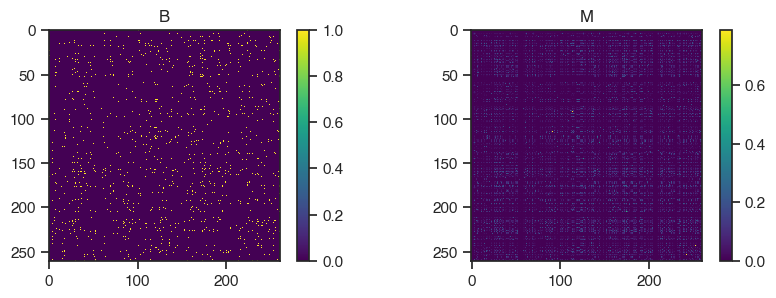

In [32]:
plt.figure(figsize=(10,3))
plt.subplot(1, 2, 1)
plt.imshow(B_0[T_f], cmap=cmap, interpolation='nearest')
# plt.imshow(B[0], cmap=cmap, interpolation='nearest')
plt.colorbar(fraction=0.046)
plt.title('B')


plt.subplot(1, 2, 2) 
plt.imshow(M_an, cmap=cmap, interpolation='nearest') #values of Q at entries of B
plt.colorbar(fraction=0.046)
plt.title('M') 

plt.show()

In [33]:
M_an = (1-QIJ_dense) * (1 - beta_an) + QIJ_dense * (1 - phi_an)# to calculate AUC
DynACD.cv_functions.calculate_AUC(M_an, B_0[T_f])

0.8259817043900166

In [34]:
B_aggre = B_0.sum(axis=0)

0.005


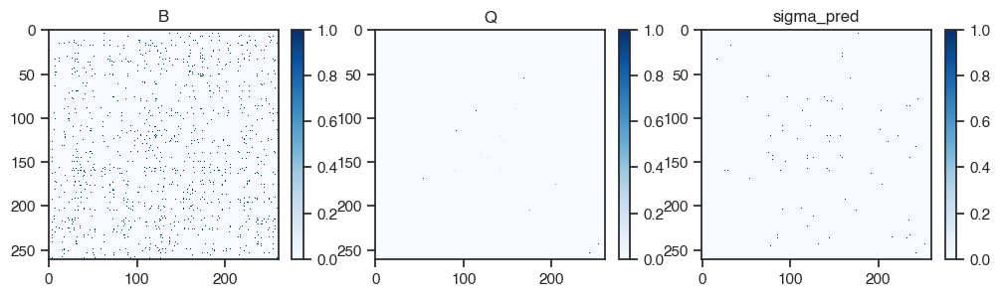

In [35]:
cmap = 'Blues'
mask_tmp = np.zeros(B_aggre.shape)
mask_tmp[B_aggre > 0] = 1  

# threshold = np.max(QIJ_dense*mask_tmp) * 0.1
threshold = np.max(QIJ_dense*mask_tmp) * 0.005
print(threshold)

z_pred = np.copy(QIJ_dense*mask_tmp)
# z_pred = np.copy(QIJ_dense)
if threshold > 0:
    z_pred[z_pred<threshold] = 0
    z_pred[z_pred>=threshold] = 1

plt.figure(figsize=(12,3))
plt.subplot(1, 3, 1)
plt.imshow(B_0[T_f], cmap=cmap, interpolation='nearest') 
plt.colorbar(fraction=0.046)
plt.title('B')


plt.subplot(1, 3, 2)
plt.imshow(QIJ_dense*mask_tmp, cmap=cmap, interpolation='nearest') #values of Q at entries of B
plt.colorbar(fraction=0.046)
plt.title('Q')

plt.subplot(1, 3, 3)
plt.imshow(z_pred, cmap=cmap, interpolation='nearest') #values of Q at entries of B above a threshold 
plt.colorbar(fraction=0.046)
plt.title('sigma_pred')


plt.show()

### Plot communities

In [36]:
nodeName2Id = {n:i for i,n in enumerate(A_0[0].nodes())}
nodeId2Name = {i:n for i,n in enumerate(A_0[0].nodes())}

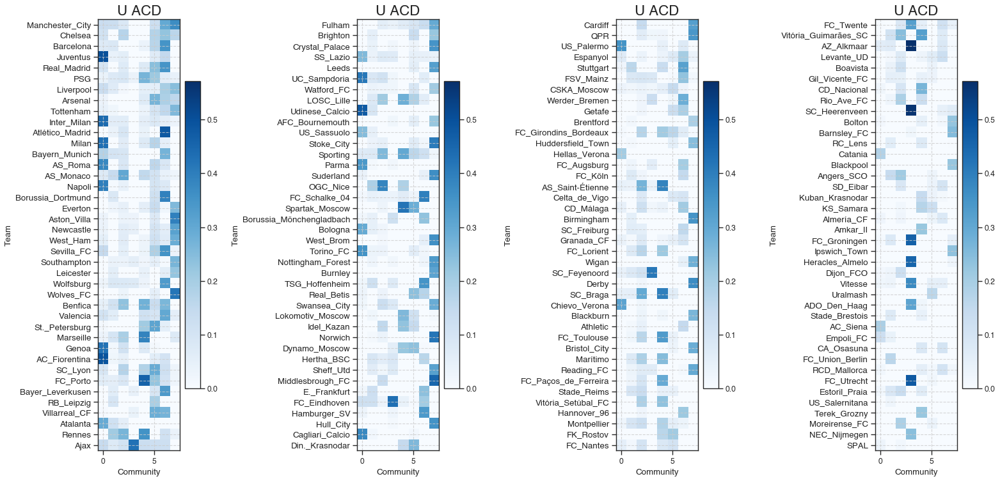

In [37]:
# Draw Plot
L = 4
alpha = 0.8
lw = 10

umax = u_an.max()
mask = df_meta.node.isin(A_0[0].nodes())

n_max = 40
plt.figure(figsize=(20,10), dpi= 80)

plt.subplot(1,L,1)

node_order = np.array([nodeName2Id[n] for n in df_meta[mask].node.iloc[:n_max]])

plt.imshow(u_an[node_order], cmap = cmap, aspect='auto',vmax = umax)
plt.yticks(df_meta[mask].index[:n_max],df_meta[mask].node.iloc[:n_max], fontsize=10)
plt.colorbar()
plt.title('u ACD')

# Decorations
plt.gca().set(ylabel='Team', xlabel='Community')
plt.yticks(df_meta[mask].index[:n_max], df_meta[mask].node.iloc[:n_max], fontsize=12)
plt.title('U ACD', fontdict={'size':20})
plt.grid(linestyle='--', alpha=alpha)


plt.subplot(1,L,2)

n_2 = 40
node_order = np.array([nodeName2Id[n] for n in df_meta[mask].node.iloc[n_2:n_2+n_max]])

plt.imshow(u_an[node_order], cmap = cmap, aspect='auto',vmax = umax)
plt.yticks(df_meta[mask].index[:n_max],df_meta[mask].node.iloc[n_2:n_2+n_max], fontsize=10)
plt.colorbar()
plt.title('u ACD')

# Decorations
plt.gca().set(ylabel='Team', xlabel='Community')
plt.yticks(df_meta[mask].index[:n_max], df_meta[mask].node.iloc[n_2:n_2+n_max], fontsize=12)
plt.title('U ACD', fontdict={'size':20})
plt.grid(linestyle='--', alpha=alpha)

plt.subplot(1,L,3)

n_2 = 80
node_order = np.array([nodeName2Id[n] for n in df_meta[mask].node.iloc[n_2:n_2+n_max]])

plt.imshow(u_an[node_order], cmap = cmap, aspect='auto',vmax = umax)
plt.yticks(df_meta[mask].index[:n_max],df_meta[mask].node.iloc[n_2:n_2+n_max], fontsize=10)
plt.colorbar()
plt.title('u ACD')

# Decorations
plt.gca().set(ylabel='Team', xlabel='Community')
plt.yticks(df_meta[mask].index[:n_max], df_meta[mask].node.iloc[n_2:n_2+n_max], fontsize=12)
plt.title('U ACD', fontdict={'size':20})
plt.grid(linestyle='--', alpha=alpha)

plt.subplot(1,L,4)

n_2 = 120
node_order = np.array([nodeName2Id[n] for n in df_meta[mask].node.iloc[n_2:n_2+n_max]])

plt.imshow(u_an[node_order], cmap = cmap, aspect='auto',vmax = umax)
plt.yticks(df_meta[mask].index[:n_max],df_meta[mask].node.iloc[n_2:n_2+n_max], fontsize=10)
plt.colorbar()
plt.title('u ACD')

# Decorations
plt.gca().set(ylabel='Team', xlabel='Community')
plt.yticks(df_meta[mask].index[:n_max], df_meta[mask].node.iloc[n_2:n_2+n_max], fontsize=12)
plt.title('U ACD', fontdict={'size':20})
plt.grid(linestyle='--', alpha=alpha)



plt.tight_layout()
plt.show()


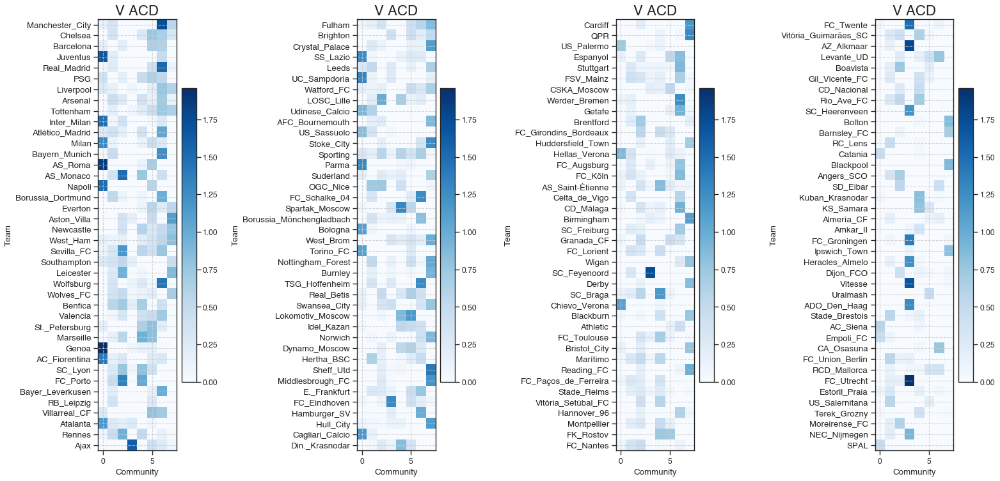

In [38]:
# Draw Plot
L = 4
alpha = 0.8
lw = 10

umax = v_an.max()
mask = df_meta.node.isin(A_0[0].nodes())

n_max = 40
plt.figure(figsize=(20,10), dpi= 80)

plt.subplot(1,L,1)

node_order = np.array([nodeName2Id[n] for n in df_meta[mask].node.iloc[:n_max]])

plt.imshow(v_an[node_order], cmap = cmap, aspect='auto',vmax = umax)
plt.yticks(df_meta[mask].index[:n_max],df_meta[mask].node.iloc[:n_max], fontsize=10)
plt.colorbar()
plt.title('V ACD')

# Decorations
plt.gca().set(ylabel='Team', xlabel='Community')
plt.yticks(df_meta[mask].index[:n_max], df_meta[mask].node.iloc[:n_max], fontsize=12)
plt.title('V ACD', fontdict={'size':20})
plt.grid(linestyle='--', alpha=alpha)


plt.subplot(1,L,2)

n_2 = 40
node_order = np.array([nodeName2Id[n] for n in df_meta[mask].node.iloc[n_2:n_2+n_max]])

plt.imshow(v_an[node_order], cmap = cmap, aspect='auto',vmax = umax)
plt.yticks(df_meta[mask].index[:n_max],df_meta[mask].node.iloc[n_2:n_2+n_max], fontsize=10)
plt.colorbar()
plt.title('V ACD')

# Decorations
plt.gca().set(ylabel='Team', xlabel='Community')
plt.yticks(df_meta[mask].index[:n_max], df_meta[mask].node.iloc[n_2:n_2+n_max], fontsize=12)
plt.title('V ACD', fontdict={'size':20})
plt.grid(linestyle='--', alpha=alpha)

plt.subplot(1,L,3)

n_2 = 80
node_order = np.array([nodeName2Id[n] for n in df_meta[mask].node.iloc[n_2:n_2+n_max]])

plt.imshow(v_an[node_order], cmap = cmap, aspect='auto',vmax = umax)
plt.yticks(df_meta[mask].index[:n_max],df_meta[mask].node.iloc[n_2:n_2+n_max], fontsize=10)
plt.colorbar()
plt.title('V ACD')

# Decorations
plt.gca().set(ylabel='Team', xlabel='Community')
plt.yticks(df_meta[mask].index[:n_max], df_meta[mask].node.iloc[n_2:n_2+n_max], fontsize=12)
plt.title('V ACD', fontdict={'size':20})
plt.grid(linestyle='--', alpha=alpha)

plt.subplot(1,L,4)

n_2 = 120
node_order = np.array([nodeName2Id[n] for n in df_meta[mask].node.iloc[n_2:n_2+n_max]])

plt.imshow(v_an[node_order], cmap = cmap, aspect='auto',vmax = umax)
plt.yticks(df_meta[mask].index[:n_max],df_meta[mask].node.iloc[n_2:n_2+n_max], fontsize=10)
plt.colorbar()
plt.title('V ACD')

# Decorations
plt.gca().set(ylabel='Team', xlabel='Community')
plt.yticks(df_meta[mask].index[:n_max], df_meta[mask].node.iloc[n_2:n_2+n_max], fontsize=12)
plt.title('V ACD', fontdict={'size':20})
plt.grid(linestyle='--', alpha=alpha)



plt.tight_layout()
plt.show()


### Sorting by u or v

In [39]:
from itertools import product

In [40]:
n_cols = 4
n_rows = 2
assert n_rows * n_cols == u_an.shape[1]

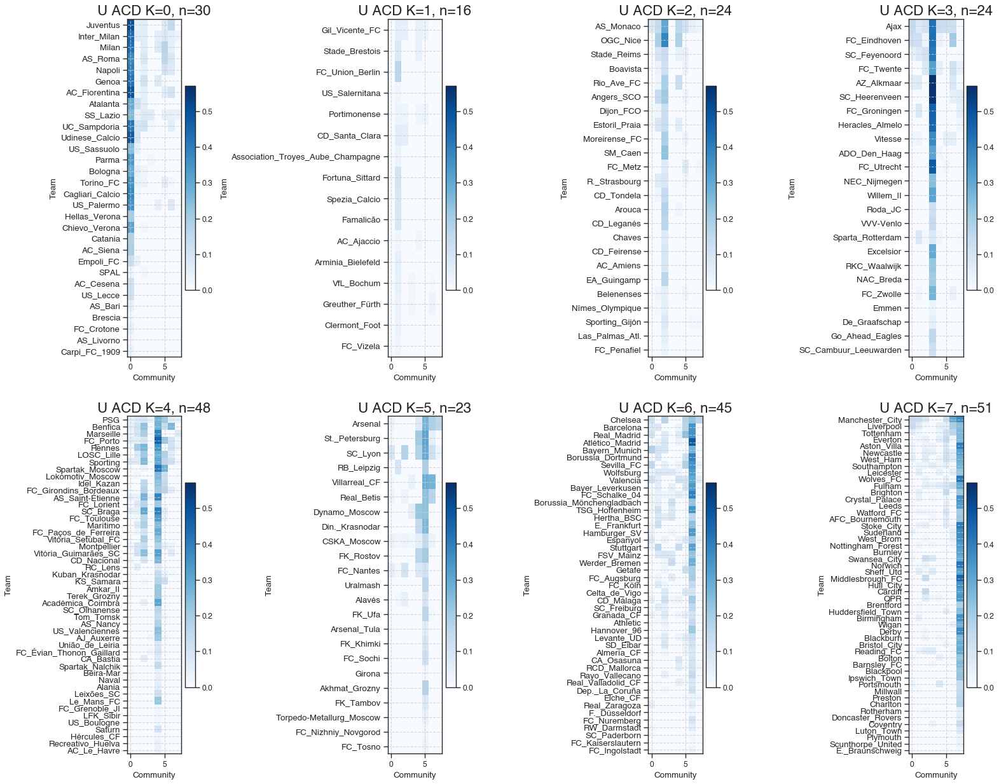

In [41]:
cmap = 'Blues'
# Draw Plot
L = u_an.shape[1]
alpha = 0.8
lw = 10

umax = u_an.max()

plt.figure(figsize=(20,16), dpi= 80)

z = 0
for k, (r,c) in enumerate(product(np.arange(n_rows),np.arange(n_cols))):
    
    plt.subplot(n_rows,n_cols,k+1)

    selected_node_ids = np.where(np.argmax(u_an,axis=1) == k)[0]
    selected_node_names = [nodeId2Name[i] for i in selected_node_ids]
    mask = df_meta.node.isin(selected_node_names) 
    n = np.sum(mask)
    yticks = np.arange(n)

    node_order = np.array([nodeName2Id[n] for n in df_meta[mask].node])

    plt.imshow(u_an[node_order], cmap = cmap, aspect='auto',vmax = umax)
    plt.yticks(yticks,df_meta[mask].node, fontsize=10)
    plt.colorbar()

    # Decorations
    plt.gca().set(ylabel='Team', xlabel='Community')
    plt.yticks(yticks, df_meta[mask].node, fontsize=12)
    plt.title(f'U ACD K={k}, n={n}', fontdict={'size':20})
    plt.grid(linestyle='--', alpha=alpha)


plt.tight_layout()
plt.show()


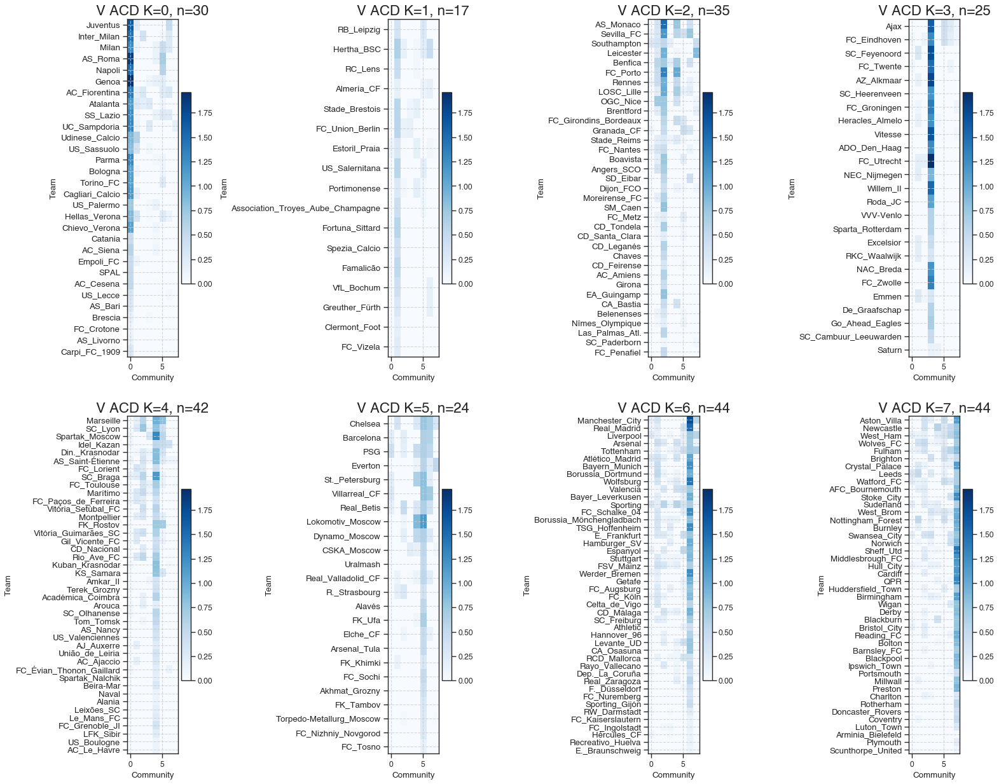

In [42]:
# Draw Plot
L = v_an.shape[1]
alpha = 0.8
lw = 10

umax = v_an.max()

plt.figure(figsize=(20,16), dpi= 80)

z = 0
for k, (r,c) in enumerate(product(np.arange(n_rows),np.arange(n_cols))):
    
    plt.subplot(n_rows,n_cols,k+1)

    selected_node_ids = np.where(np.argmax(v_an,axis=1) == k)[0]
    selected_node_names = [nodeId2Name[i] for i in selected_node_ids]
    mask = df_meta.node.isin(selected_node_names) 
    n = np.sum(mask)
    yticks = np.arange(n)

    node_order = np.array([nodeName2Id[n] for n in df_meta[mask].node])

    plt.imshow(v_an[node_order], cmap = cmap, aspect='auto',vmax = umax)
    plt.yticks(yticks,df_meta[mask].node, fontsize=10)
    plt.colorbar()

    # Decorations
    plt.gca().set(ylabel='Team', xlabel='Community')
    plt.yticks(yticks, df_meta[mask].node, fontsize=12)
    plt.title(f'V ACD K={k}, n={n}', fontdict={'size':20})
    plt.grid(linestyle='--', alpha=alpha)


plt.tight_layout()
plt.show()


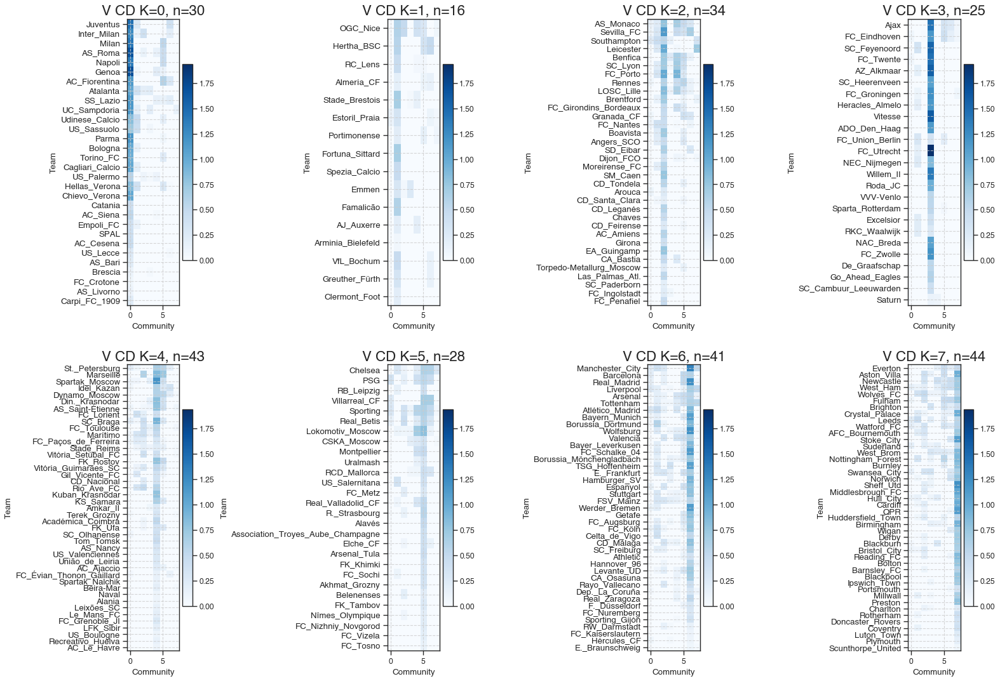

In [43]:
# Draw Plot
L = v_an.shape[1]
alpha = 0.8
lw = 10

Pu = DynACD.tools2.CalculatePermutation(v_an_0,v_an)
v_an_0_P = np.dot(v_an_0, Pu)  # permute inferred matrix

umax = v_an_0_P.max()

plt.figure(figsize=(20,14), dpi= 80)

z = 0
for k, (r,c) in enumerate(product(np.arange(n_rows),np.arange(n_cols))):
    
    plt.subplot(n_rows,n_cols,k+1)

    selected_node_ids = np.where(np.argmax(v_an_0_P,axis=1) == k)[0]
    selected_node_names = [nodeId2Name[i] for i in selected_node_ids]
    mask = df_meta.node.isin(selected_node_names) 
    n = np.sum(mask)
    yticks = np.arange(n)

    node_order = np.array([nodeName2Id[n] for n in df_meta[mask].node])

    plt.imshow(v_an_0_P[node_order], cmap = cmap, aspect='auto',vmax = umax)
    plt.yticks(yticks,df_meta[mask].node, fontsize=10)
    plt.colorbar()

    # Decorations
    plt.gca().set(ylabel='Team', xlabel='Community')
    plt.yticks(yticks, df_meta[mask].node, fontsize=12)
    plt.title(f'V CD K={k}, n={n}', fontdict={'size':20})
    plt.grid(linestyle='--', alpha=alpha)


plt.tight_layout()
plt.show()


### Get `df_anomalies`

In [136]:
B_aggre = B_0.sum(axis=0)
mask_tmp = np.zeros(B_aggre.shape)
mask_tmp[B_aggre > 0] = 1  

lambda_ij = DynACD.cv_functions._lambda0_full(u_an, v_an, w_an).mean(axis=0)

index_to_name = {node_idx: node_name for node_idx, node_name in enumerate(A_0[0].nodes())}

df_anomalies = ttl.get_df_anomalies(QIJ_dense,index_to_name, mask=mask_tmp, df_meta=df_meta,lambdaIJ=lambda_ij)
# df_anomalies.head(n=30)
df_anomalies.sort_values(by=['Q_ij','lambda_ij'],ascending=[False,False]).head(n=30)

,ego_id,alter_id,Q_ij,ego_name,alter_name,lambda_ij,ego_fee_received,alter_fee_received,ego_fee_spent,alter_fee_spent
0,168,54,1.000000,NEC_Nijmegen,CA_Osasuna,0.000000,26.0,62.0,65.0,68.0
1,54,168,1.000000,CA_Osasuna,NEC_Nijmegen,0.000000,62.0,26.0,68.0,65.0
2,243,253,1.000000,Udinese_Calcio,Watford_FC,0.052168,588.0,259.0,389.0,403.0
3,253,243,1.000000,Watford_FC,Udinese_Calcio,0.013839,259.0,588.0,403.0,389.0
4,114,92,1.000000,FC_Union_Berlin,FC_Augsburg,0.028696,70.0,91.0,68.0,159.0
5,92,114,1.000000,FC_Augsburg,FC_Union_Berlin,0.012898,91.0,70.0,159.0,68.0
6,175,205,0.559615,OGC_Nice,SC_Lyon,0.183308,292.0,772.0,342.0,566.0
7,205,175,0.559615,SC_Lyon,OGC_Nice,0.068332,772.0,292.0,566.0,342.0
9,221,200,0.451271,Sporting,SC_Braga,0.180583,570.0,315.0,353.0,132.0
8,200,221,0.451271,SC_Braga,Sporting,0.156775,315.0,570.0,132.0,353.0


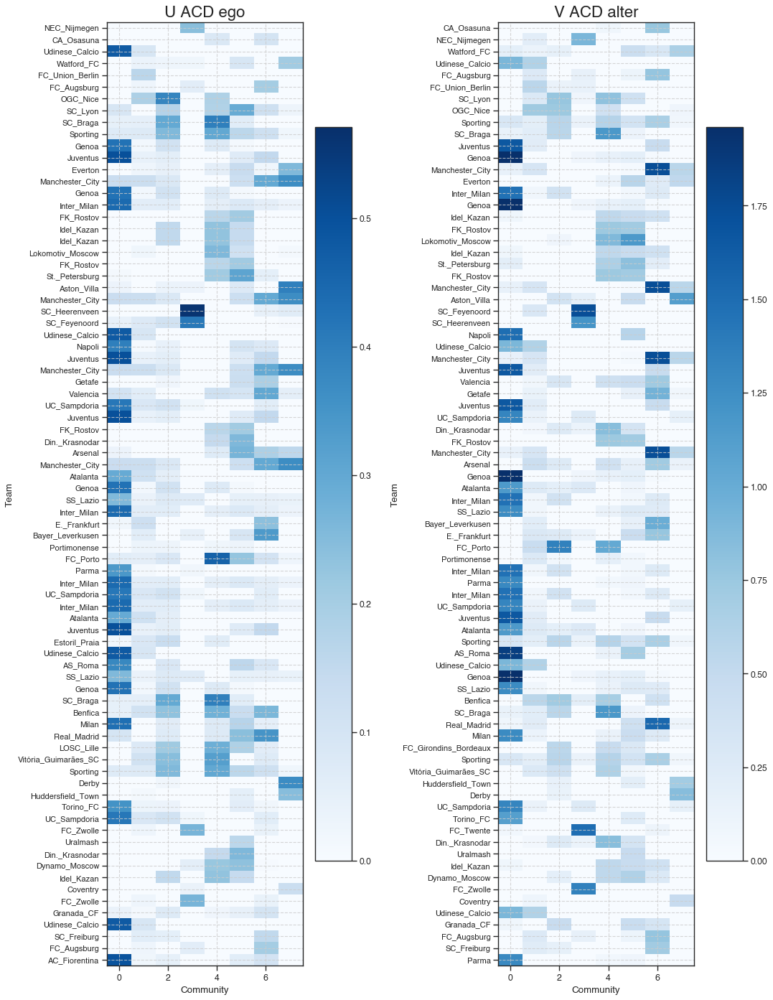

In [46]:
# Draw Plot
L = v_an.shape[1]
alpha = 0.8
lw = 10

umax = u_an.max()
vmax = v_an.max()

plt.figure(figsize=(14,18), dpi= 80)


n_max = 80    # number of anomalous transfers to display

'''
u sender
'''
plt.subplot(1,2,1)


selected_node_ids = df_anomalies['ego_id'].iloc[:n_max]
selected_node_names = df_anomalies['ego_name'].iloc[:n_max]
yticks = np.arange(n_max)

plt.imshow(u_an[selected_node_ids], cmap = cmap, aspect='auto',vmax = umax)
plt.yticks(yticks,selected_node_names, fontsize=10)
plt.colorbar()

# Decorations
plt.gca().set(ylabel='Team', xlabel='Community')
plt.title(f'U ACD ego', fontdict={'size':20})
plt.grid(linestyle='--', alpha=alpha)


'''
u receiver
'''
plt.subplot(1,2,2)

selected_node_ids = df_anomalies['alter_id'].iloc[:n_max]
selected_node_names = df_anomalies['alter_name'].iloc[:n_max]
yticks = np.arange(n_max)

plt.imshow(v_an[selected_node_ids], cmap = cmap, aspect='auto',vmax = vmax)
plt.yticks(yticks,selected_node_names, fontsize=10)
plt.colorbar()

# Decorations
plt.gca().set(ylabel='Team', xlabel='Community')
plt.title(f'V ACD alter', fontdict={'size':20})
plt.grid(linestyle='--', alpha=alpha)


plt.tight_layout()
plt.show()


### Plot subgraph with italian teams, they are the most involved in anomalous edges

In [47]:
def get_subgraph_from_nodelist(G: nx.Graph,nodelist: list, edge_direction: str = 'both') -> nx.Graph:
    '''
    Get a subgraph containing all the nodes in nodelist but ALSO nodes connected to them who are not in nodelist
    networkx default G.subgraph() excludes these boundary nodes
    '''
    if edge_direction == 'both':
        selected_edges = set(list(G.out_edges(nodelist)) + list(G.in_edges(nodelist)))
    elif edge_direction == 'in':
        selected_edges = set(list(G.in_edges(nodelist)))
    elif edge_direction == 'out':
        selected_edges = set(list(G.out_edges(nodelist)))
        
    H = G.__class__()
    H.add_nodes_from(nodelist)
    H.add_edges_from(selected_edges)
    
    return H
    

In [60]:
def plot_subgraph(
    G: nx.Graph,
    G0: nx.Graph,
    nodeName2Id: dict,
    df_anomalies: pd.DataFrame,
    membership: np.ndarray,
    pos: dict = None,
    scale: float = 1.5,
    threshold_Qij: float = 0.5,
    node_size_factor: float = 0.01,
    offset_edge_width: int = 1,
    color_regular: str = 'grey',
    color_anomaly: str = 'r',
    ax: plt.Axes = None,
    **kw_args
):
    if pos is None:
        pos = nx.circular_layout(G,scale=scale)
    
    sorted_id = [nodeName2Id[n] for n in G.nodes()]
    U = membership[sorted_id]
    node_size = np.array([G0.in_degree[i] for i in G.nodes()]) + 0.1
    node_size = np.ones(len(G))

    edge_width = [offset_edge_width+ttl.get_Qij_from_df_anomalies(df_anomalies,i=e[0],j=e[1]) for e in G.edges()]
    edge_color = [color_regular if edge_width[i]-offset_edge_width < threshold_Qij else color_anomaly for i in range(len(edge_width))]
    
    config = {'node_size':node_size,'node_size_factor': node_size_factor,'edge_width':edge_width,'edge_color':edge_color,'ax':ax}
    
    ttl.plotting_map(G,pos,U=U, **config)

In [56]:
beta_an,phi_an,ell_an

(array([0.80790321]), array(0.21129708), array(0.59621744))

Text(0.5, 1.0, 't=-1')

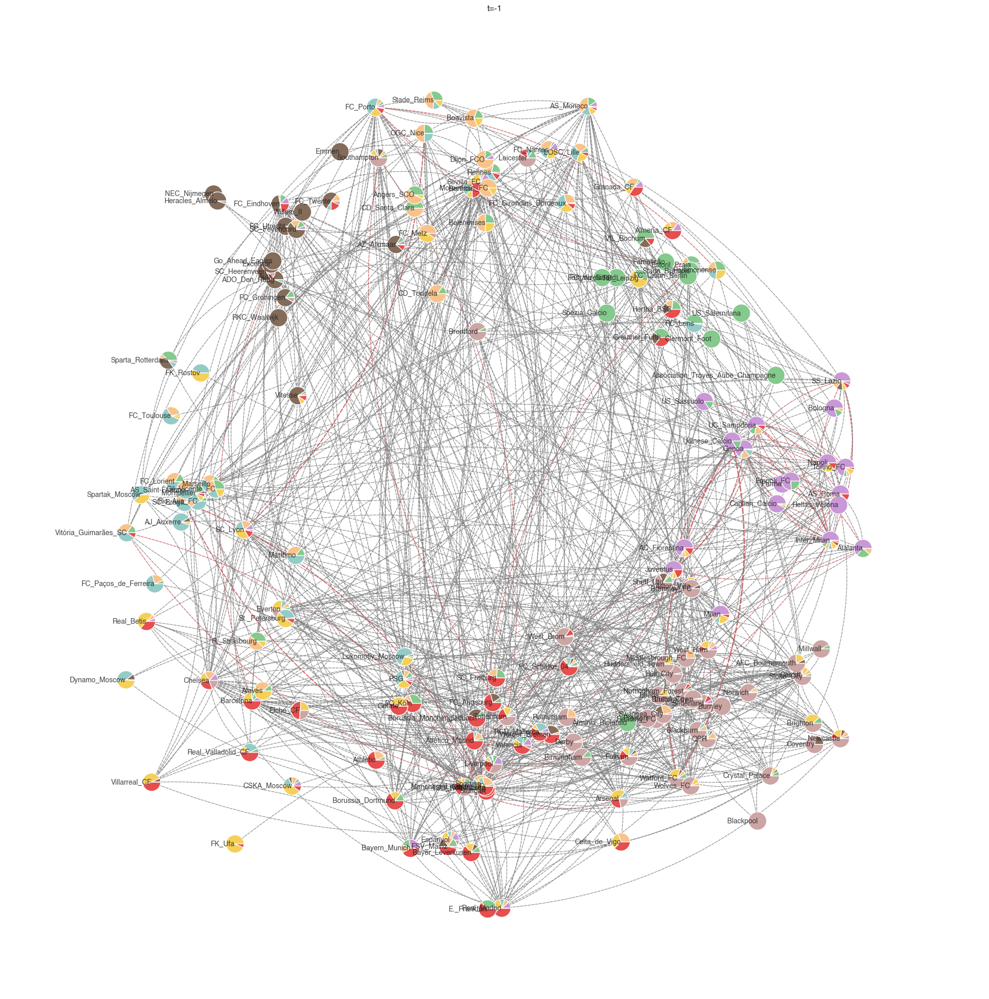

In [57]:
fig,ax = plt.subplots(1,1,figsize=(20,20))

tid = -1

selected_node_names = []
for k in np.arange(v_an.shape[-1]):
    selected_node_ids = np.where(np.argmax(v_an,axis=1) == k)[0]
    selected_node_names.extend([nodeId2Name[i] for i in selected_node_ids])
# selected_node_names = ['Milan']

selected_node_names = [n for n in selected_node_names if ttl.get_transfer(df,source=n).iloc[:,2:].sum(axis=1).sum() > 100]
pos = ttl.assign_pos_based_on_membership(selected_node_names,v_an, nodeName2Id)

G = get_subgraph_from_nodelist(A_0[tid],selected_node_names,edge_direction='both')

pos = ttl.assign_pos_based_on_membership(G.nodes(),v_an, nodeName2Id,delta=0.5)
# pos = nx.circular_layout(G,scale=scale)

plot_subgraph(G,A_0[tid],nodeName2Id,df_anomalies,u_an,ax=ax,scale=2,pos=pos,node_size_factor=0.03)
ax.set_title(f"t={tid}")

In [58]:
len(A_0)

5

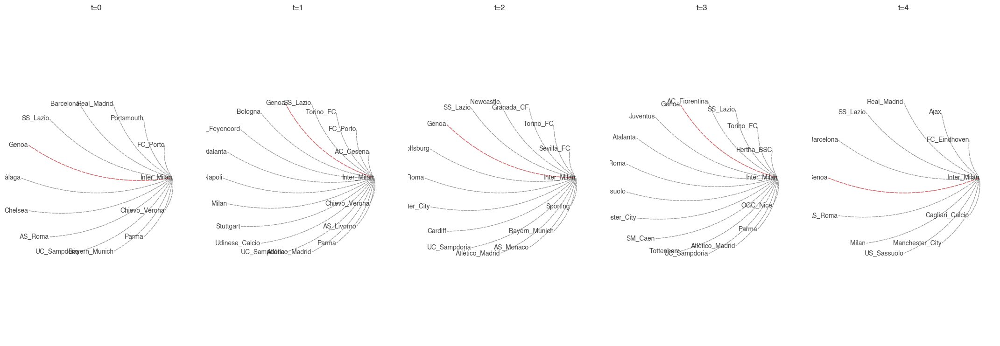

In [61]:
fig,ax = plt.subplots(1,len(A_0),figsize=(22,8))

for tid in range(len(A_0)):

    # tid = -2 # time step id
    k = 6

    selected_node_ids = np.where(np.argmax(v_an,axis=1) == k)[0]
    selected_node_names = [nodeId2Name[i] for i in selected_node_ids]
    selected_node_names = ['Inter_Milan']
    G = get_subgraph_from_nodelist(A_0[tid],selected_node_names,edge_direction='in')
    plot_subgraph(G,A_0[tid],nodeName2Id,df_anomalies,u_an,ax=ax[tid],scale=2, threshold_Qij=0.2)
    ax[tid].set_title(f"t={tid}")

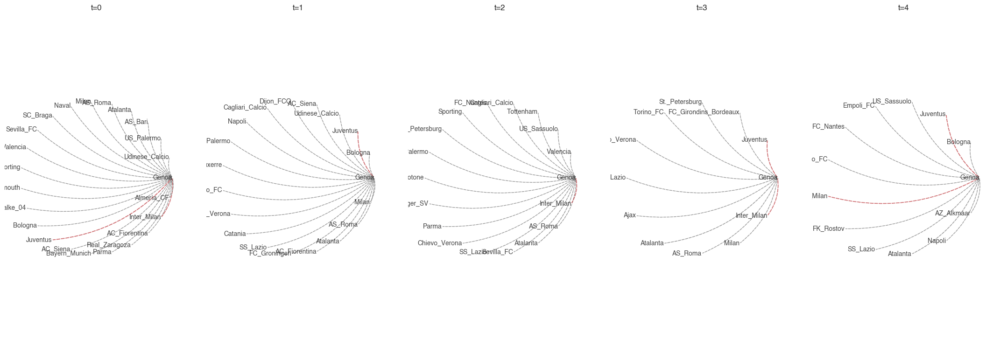

In [115]:
fig,ax = plt.subplots(1,len(A_0),figsize=(22,8))

for tid in range(len(A_0)):

    # tid = -2 # time step id
    k = 6

    selected_node_ids = np.where(np.argmax(v_an,axis=1) == k)[0]
    selected_node_names = [nodeId2Name[i] for i in selected_node_ids]
    selected_node_names = ['Genoa']
    G = get_subgraph_from_nodelist(A_0[tid],selected_node_names,edge_direction='in')
    plot_subgraph(G,A_0[tid],nodeName2Id,df_anomalies,u_an,ax=ax[tid],scale=2,threshold_Qij=0.2)
    ax[tid].set_title(f"t={tid}")

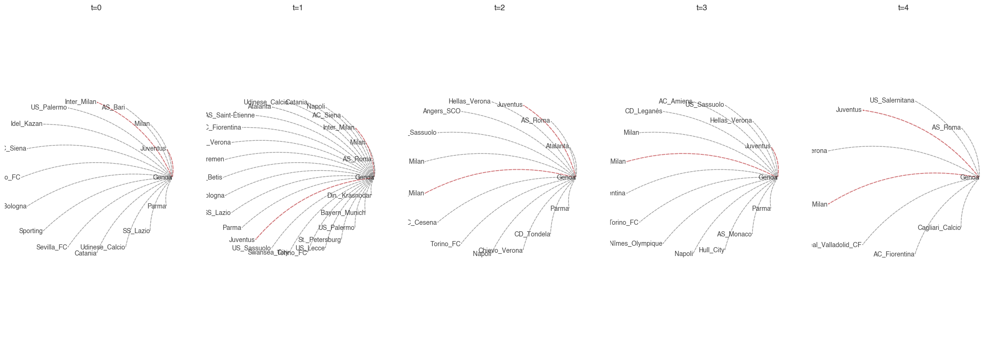

In [116]:
fig,ax = plt.subplots(1,len(A_0),figsize=(22,8))

for tid in range(len(A_0)):

    # tid = -2 # time step id
    k = 6

    selected_node_ids = np.where(np.argmax(v_an,axis=1) == k)[0]
    selected_node_names = [nodeId2Name[i] for i in selected_node_ids]
    selected_node_names = ['Genoa']
    G = get_subgraph_from_nodelist(A_0[tid],selected_node_names,edge_direction='out')
    plot_subgraph(G,A_0[tid],nodeName2Id,df_anomalies,u_an,ax=ax[tid],scale=2,threshold_Qij=0.2)
    ax[tid].set_title(f"t={tid}")

## Manipulate parameters to check how `Q_ij` changes

In [139]:
beta_an,phi_an

(array([0.80790321]), array(0.21129708))

In [133]:
ni = 'Inter_Milan'
nj = 'Parma'

nz = 'Genoa'
i,j = nodeName2Id[ni],nodeName2Id[nj]
z = nodeName2Id[nz]
print(u_an[i])
print(v_an[j])


[0.44274119 0.05824799 0.06028404 0.         0.05552822 0.07820348
 0.05485816 0.03323376]
[1.28745932e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 5.54823967e-02 8.39035415e-02 3.37391598e-06 0.00000000e+00]


In [137]:
B_0_modified = np.copy(B_0[0])
B_train_modified = np.copy(B_train)
u_modified = np.copy(u_an)
v_modified = np.copy(v_an)

# B_train_modified[:,i,j] = B_train_modified[:,z,i]
# B_train_modified[:,j,i] = B_train_modified[:,z,i]
# B_train_modified[-1,i,j] = 1
# B_train_modified[-1,j,i] = 1


# u_modified[z] = np.copy(u_an[j])
# v_modified[z] = np.copy(v_an[j])

M0_modified = DynACD.cv_functions._lambda0_full(u_modified, v_modified, w_an[1:])
M00_modified = DynACD.cv_functions._lambda0_full(u_modified, v_modified, (w_an[0])[np.newaxis])
QIJ_dense_modified = DynACD.cv_functions.QIJ_dense(B_train_modified,(B_0_modified)[np.newaxis,:,:],M0_modified,M00_modified,T_f, beta=beta_an, phi=phi_an, ell=ell_an,pi=pi_an, mu=mu_an,EPS=1e-12) 

In [138]:
B_aggre = B_0.sum(axis=0)
mask_tmp = np.zeros(B_aggre.shape)
mask_tmp[B_aggre > 0] = 1  

lambda_ij = DynACD.cv_functions._lambda0_full(u_modified, v_modified, w_an).mean(axis=0)

index_to_name = {node_idx: node_name for node_idx, node_name in enumerate(A_0[0].nodes())}

df_anomalies_modified = ttl.get_df_anomalies(QIJ_dense_modified,index_to_name, mask=mask_tmp, df_meta=df_meta,lambdaIJ=lambda_ij)
df_anomalies_modified.head(n=20)
df_anomalies_modified.sort_values(by=['Q_ij','lambda_ij'],ascending=[False,False]).head(n=30)

,ego_id,alter_id,Q_ij,ego_name,alter_name,lambda_ij,ego_fee_received,alter_fee_received,ego_fee_spent,alter_fee_spent
0,168,54,1.000000,NEC_Nijmegen,CA_Osasuna,0.000000,26.0,62.0,65.0,68.0
1,54,168,1.000000,CA_Osasuna,NEC_Nijmegen,0.000000,62.0,26.0,68.0,65.0
2,243,253,1.000000,Udinese_Calcio,Watford_FC,0.052168,588.0,259.0,389.0,403.0
3,253,243,1.000000,Watford_FC,Udinese_Calcio,0.013839,259.0,588.0,403.0,389.0
4,114,92,1.000000,FC_Union_Berlin,FC_Augsburg,0.028696,70.0,91.0,68.0,159.0
5,92,114,1.000000,FC_Augsburg,FC_Union_Berlin,0.012898,91.0,70.0,159.0,68.0
6,175,205,0.559615,OGC_Nice,SC_Lyon,0.183308,292.0,772.0,342.0,566.0
7,205,175,0.559615,SC_Lyon,OGC_Nice,0.068332,772.0,292.0,566.0,342.0
9,221,200,0.451271,Sporting,SC_Braga,0.180583,570.0,315.0,353.0,132.0
8,200,221,0.451271,SC_Braga,Sporting,0.156775,315.0,570.0,132.0,353.0


In [122]:
# team_name = 'RB_Leipzig'
team_name = 'Manchester_City'

df_milan = ttl.get_transfer(df,source=team_name)
df_milan.loc[:,'sum_w'] = df_milan.iloc[:,2:].sum(axis=1)
# df_milan.loc[:,'Q_ij'] = df_milan.apply(lambda x: ttl.get_Qij_from_df_anomalies(df_anomalies,i=x['source'],j=x['target'],axis=0))
df_milan = df_milan.merge(df_anomalies_modified[['ego_name','alter_name','Q_ij','lambda_ij']],left_on=['source','target'],right_on=['ego_name','alter_name'],how='inner').drop(columns=['ego_name','alter_name'])
df_milan.sort_values(by=['Q_ij','sum_w','source','target'],ascending=[False,False,False,False])#.head(n=10)

,source,target,weight_t0,weight_t1,weight_t2,weight_t3,weight_t4,sum_w,Q_ij,lambda_ij
1,Manchester_City,Everton,1,1,1,1,0,4,0.308817,0.183800
84,Everton,Manchester_City,1,1,1,1,0,4,0.308817,0.110237
0,Manchester_City,Aston_Villa,1,1,1,1,0,4,0.122077,0.288239
85,Aston_Villa,Manchester_City,1,1,1,0,1,4,0.122077,0.137576
30,Manchester_City,Juventus,0,1,1,1,1,4,0.096687,0.190674
115,Juventus,Manchester_City,0,0,1,1,1,3,0.096687,0.159677
10,Manchester_City,Arsenal,1,0,1,1,1,4,0.072807,0.175691
83,Arsenal,Manchester_City,1,1,1,1,0,4,0.072807,0.201579
29,Manchester_City,AS_Roma,0,1,1,1,1,4,0.008319,0.168366
43,Manchester_City,Inter_Milan,0,0,1,1,1,3,0.007501,0.151262


In [103]:
# team_name = 'RB_Leipzig'
team_name = 'Inter_Milan'

df_milan = ttl.get_transfer(df,source=team_name)
df_milan.loc[:,'sum_w'] = df_milan.iloc[:,2:].sum(axis=1)
# df_milan.loc[:,'Q_ij'] = df_milan.apply(lambda x: ttl.get_Qij_from_df_anomalies(df_anomalies,i=x['source'],j=x['target'],axis=0))
df_milan = df_milan.merge(df_anomalies_modified[['ego_name','alter_name','Q_ij','lambda_ij']],left_on=['source','target'],right_on=['ego_name','alter_name'],how='inner').drop(columns=['ego_name','alter_name'])
df_milan.sort_values(by=['Q_ij','sum_w','source','target'],ascending=[False,False,False,False])#.head(n=10)

,source,target,weight_t0,weight_t1,weight_t2,weight_t3,weight_t4,sum_w,Q_ij,lambda_ij
49,Genoa,Inter_Milan,1,1,1,1,1,5,2.695947e-01,0.256282
4,Inter_Milan,Genoa,1,0,1,1,1,4,2.695947e-01,0.297885
50,SS_Lazio,Inter_Milan,1,1,1,1,1,5,5.935729e-02,0.210738
7,Inter_Milan,SS_Lazio,1,0,0,0,1,2,5.935729e-02,0.309109
0,Inter_Milan,Parma,1,1,1,1,1,5,3.685861e-02,0.297885
52,Parma,Inter_Milan,1,1,0,1,0,3,3.685861e-02,0.256282
51,UC_Sampdoria,Inter_Milan,1,1,1,1,0,4,2.577012e-02,0.337690
5,Inter_Milan,UC_Sampdoria,1,0,1,1,1,4,2.577012e-02,0.307770
73,Manchester_City,Inter_Milan,0,0,1,1,1,3,7.500929e-03,0.151262
2,Inter_Milan,Manchester_City,1,1,0,0,0,2,7.500929e-03,0.099307


In [113]:
# team_name = 'RB_Leipzig'
team_name = 'Inter_Milan'

df_milan = ttl.get_transfer(df,source=team_name)
df_milan.loc[:,'sum_w'] = df_milan.iloc[:,2:].sum(axis=1)
# df_milan.loc[:,'Q_ij'] = df_milan.apply(lambda x: ttl.get_Qij_from_df_anomalies(df_anomalies,i=x['source'],j=x['target'],axis=0))
df_milan = df_milan.merge(df_anomalies_modified[['ego_name','alter_name','Q_ij','lambda_ij']],left_on=['source','target'],right_on=['ego_name','alter_name'],how='inner').drop(columns=['ego_name','alter_name'])
df_milan.sort_values(by=['Q_ij','sum_w','source','target'],ascending=[False,False,False,False])#.head(n=10)

,source,target,weight_t0,weight_t1,weight_t2,weight_t3,weight_t4,sum_w,Q_ij,lambda_ij
0,Inter_Milan,Parma,1,1,1,1,1,5,3.753006e-01,0.297885
52,Parma,Inter_Milan,1,1,0,1,0,3,3.753006e-01,0.256282
49,Genoa,Inter_Milan,1,1,1,1,1,5,2.695947e-01,0.256282
4,Inter_Milan,Genoa,1,0,1,1,1,4,2.695947e-01,0.297885
50,SS_Lazio,Inter_Milan,1,1,1,1,1,5,5.935729e-02,0.210738
7,Inter_Milan,SS_Lazio,1,0,0,0,1,2,5.935729e-02,0.309109
51,UC_Sampdoria,Inter_Milan,1,1,1,1,0,4,2.577012e-02,0.337690
5,Inter_Milan,UC_Sampdoria,1,0,1,1,1,4,2.577012e-02,0.307770
73,Manchester_City,Inter_Milan,0,0,1,1,1,3,7.500929e-03,0.151262
2,Inter_Milan,Manchester_City,1,1,0,0,0,2,7.500929e-03,0.099307


In [87]:
df_milan = ttl.get_transfer(df,source=team_name)
df_milan.loc[:,'sum_w'] = df_milan.iloc[:,2:].sum(axis=1)
# df_milan.loc[:,'Q_ij'] = df_milan.apply(lambda x: ttl.get_Qij_from_df_anomalies(df_anomalies,i=x['source'],j=x['target'],axis=0))
df_milan = df_milan.merge(df_anomalies[['ego_name','alter_name','Q_ij','lambda_ij']],left_on=['source','target'],right_on=['ego_name','alter_name'],how='inner').drop(columns=['ego_name','alter_name'])
df_milan.sort_values(by=['Q_ij','sum_w','source','target'],ascending=[False,False,False,False])

,source,target,weight_t0,weight_t1,weight_t2,weight_t3,weight_t4,sum_w,Q_ij,lambda_ij
49,Genoa,Inter_Milan,1,1,1,1,1,5,2.586220e-01,0.335983
4,Inter_Milan,Genoa,1,0,1,1,1,4,2.586220e-01,0.455892
50,SS_Lazio,Inter_Milan,1,1,1,1,1,5,5.935729e-02,0.210738
7,Inter_Milan,SS_Lazio,1,0,0,0,1,2,5.935729e-02,0.309109
0,Inter_Milan,Parma,1,1,1,1,1,5,3.685861e-02,0.297885
52,Parma,Inter_Milan,1,1,0,1,0,3,3.685861e-02,0.256282
51,UC_Sampdoria,Inter_Milan,1,1,1,1,0,4,2.577012e-02,0.337690
5,Inter_Milan,UC_Sampdoria,1,0,1,1,1,4,2.577012e-02,0.307770
73,Manchester_City,Inter_Milan,0,0,1,1,1,3,7.500929e-03,0.151262
2,Inter_Milan,Manchester_City,1,1,0,0,0,2,7.500929e-03,0.099307


In [74]:
ttl.get_transfer(df,'FC_Augsburg','FC_Union_Berlin',both_directions=True)

,source,target,weight_t0,weight_t1,weight_t2,weight_t3,weight_t4
1875,FC_Augsburg,FC_Union_Berlin,0,0,0,1,1
2319,FC_Union_Berlin,FC_Augsburg,0,0,0,1,1


In [75]:
ttl.get_transfer(df,'Watford_FC').iloc[:120]

,source,target,weight_t0,weight_t1,weight_t2,weight_t3,weight_t4
5474,Watford_FC,Derby,1,1,1,0,0
5483,Watford_FC,Reading_FC,1,1,1,0,0
5484,Watford_FC,Sheff_Utd,1,1,1,0,0
5500,Watford_FC,Bolton,1,1,0,0,0
5496,Watford_FC,Ipswich_Town,1,1,0,0,0
5495,Watford_FC,Blackpool,1,0,0,0,0
5479,Watford_FC,Portsmouth,1,0,0,0,0
5486,Watford_FC,Brighton,0,1,0,0,1
5478,Watford_FC,Cardiff,0,1,0,0,0
5493,Watford_FC,Huddersfield_Town,0,1,0,0,0


### Get unique undirected anomalous edges

In [173]:
unique_edges = ttl.get_unique_anomalous_edges(df_anomalies,threshold=threshold)
len(unique_edges)

59

## **('Aston_Villa', 'Manchester_City')** <br> 
https://www.transfermarkt.com/aston-villa_manchester-city/vorbericht/spielbericht/3837972 <br>

https://www.transfermarkt.com/jack-grealish/profil/spieler/203460 <br>
https://www.transfermarkt.com/douglas-luiz/profil/spieler/447661  <br>
https://www.transfermarkt.com/gareth-barry/profil/spieler/3291 <br>


## **('Everton', 'Manchester_City')** <br> 
https://www.transfermarkt.com/john-stones/profil/spieler/186590 <br>
https://www.transfermarkt.com/gareth-barry/profil/spieler/3291 <br>


## **('Milan', 'Torino_FC')** <br>

https://www.transfermarkt.com/vergleich-fc-turin-toro-ac-mailand-milan/vereinsvergleich/statistik/416_5  <br>


## **('Milan', 'SS_Lazio')** <br>

https://www.transfermarkt.com/vergleich-lazio-rom-lazio-ac-mailand-milan/vereinsvergleich/statistik/398_5  <br>


## **('Manchester_City', 'Milan')** <br>
https://www.transfermarkt.com/vergleich-manchester-city-city-ac-mailand-milan/vereinsvergleich/statistik/281_5 <br>

https://www.transfermarkt.com/robinho/profil/spieler/15511

## **('Juventus', 'UC_Sampdoria')** <br>
https://www.transfermarkt.com/vergleich-juventus-turin-juve-uc-sampdoria-samp/vereinsvergleich/statistik/506_1038 <br>
https://www.transfermarkt.com/emil-audero/profil/spieler/256339 <br>


## **('Milan', 'UC_Sampdoria')** <br>
https://www.transfermarkt.com/vergleich-uc-sampdoria-samp-ac-mailand-milan/vereinsvergleich/statistik/1038_5 <br>




## **('OGC_Nice', 'RC_Lens')**<br>
https://www.transfermarkt.com/ignatius-ganago/transfers/spieler/531949/transfer_id/4050691 <br>



## **('Barcelona', 'Villarreal_CF')**<br>

#### #22 Denis Suárez
15/16, Aug 29, 2015, Barcelona-> Villarreal, (MV:€12.00m, Fee:€4.00m)<br>
16/17, Jul  4, 2016, Villarreal-> Barcelona, (MV:€12.00m, Fee:€3.25m)  <br> 
https://www.transfermarkt.com/denis-suarez/transfers/spieler/165007/transfer_id/1331649<br>


## **('Barcelona', 'Villarreal_CF')**<br>
#### #22 Martín Cáceres
08/09
Jul 1, 2008, Villarreal->Barcelona (MV:€6.00m, Fee: €16.50m)<br>

09/10
Aug 6, 2009, Barcelona->Juventus (MV: €7.00m, Loan fee: €500k)
https://www.transfermarkt.com/martin-caceres/profil/spieler/54935<br>



## **('Sevilla_FC', 'Tottenham')**<br>

#### #11 Bryan Gil
https://www.transfermarkt.com/bryan-gil/profil/spieler/537382<br>


####  #17 Federico Fazio
https://www.transfermarkt.com/federico-fazio/profil/spieler/45314<br>



## **('Spartak_Moscow', 'St._Petersburg')**<br>

https://www.transfermarkt.com/roman-shirokov/profil/spieler/48550 <br>
https://www.transfermarkt.com/artem-dzyuba/profil/spieler/48067 <br>
https://www.transfermarkt.com/aleksandr-kokorin/profil/spieler/89086 <br>
https://www.transfermarkt.com/vladimir-bystrov/profil/spieler/15647 <br>



## **('Kazan', 'KS_Samara')**<br>
https://www.transfermarkt.com/sergey-ryzhikov/profil/spieler/25035 <br>
https://www.transfermarkt.com/evgeniy-bashkirov/profil/spieler/104200 <br> 
https://www.transfermarkt.com/taras-burlak/profil/spieler/70212 <br>
https://www.transfermarkt.com/denis-tkachuk/profil/spieler/73854 <br>
https://www.transfermarkt.com/evgeniy-balyajkin/profil/spieler/48491 <br>
https://www.transfermarkt.com/petr-nemov/profil/spieler/25023 <br>



## **('FK_Ufa', 'Huddersfield_Town')**<br>
https://www.transfermarkt.com/ivan-paurevic/transfers/spieler/31868/transfer_id/1499430 <br>


## **('OGC_Nice', 'RC_Lens')**<br>
https://www.transfermarkt.com/ignatius-ganago/transfers/spieler/531949/transfer_id/4050691 <br>

# Study weight as metadata

In [159]:
weight_dict = dict(zip(input_meta_in_data['Alter'], input_meta_in_data['weight'])) # money spent in transfers

NameError: name 'input_meta_in_data' is not defined

In [174]:
edge_lists_T = [] # all aboserved edges

for idx in range(B_0.shape[0]):
    edge_lists_T.extend(A_0[idx].edges)

edge_lists_T_unique = list(set(edge_lists_T))  
len(edge_lists_T_unique)

5752

In [175]:
graph = A_0[T_f]
for node in graph.nodes:
    if node in weight_dict:
        graph.nodes[node]['weight'] = weight_dict[node]
    else: 
        graph.nodes[node]['weight'] = 0  

NameError: name 'weight_dict' is not defined

In [176]:
len(list(list(zip(*edge_lists_T_unique))[0]))

5752

In [177]:
df_edges

NameError: name 'df_edges' is not defined

In [178]:
df_edges = pd.DataFrame({'Ego':list(list(zip(*edge_lists_T_unique))[0]),'Alter':list(list(zip(*edge_lists_T_unique))[1])})
df_edges.loc[:,'is_regular'] = df_edges.apply(lambda x: is_regular(x['Ego'],x['Alter'],edge_Z_pr_lab),axis=1)

NameError: name 'is_regular' is not defined

In [ ]:
df_edges = df_edges.merge(input_meta_in_data,left_on='Ego',right_on='Alter',suffixes=['','_y'])
df_edges.rename(columns={'weight':'ego_in_weight'},inplace=True)
df_edges.drop(columns=['Alter_y'],inplace=True)
df_edges = df_edges.merge(input_meta_in_data,on='Alter')
df_edges.rename(columns={'weight':'alter_in_weight'},inplace=True)

df_edges = df_edges.merge(input_meta_out_data,on='Ego')
df_edges.rename(columns={'weight':'ego_out_weight'},inplace=True)

df_edges = df_edges.merge(input_meta_out_data,left_on='Alter',right_on='Ego',suffixes=['','_y'])
df_edges.rename(columns={'weight':'alter_out_weight'},inplace=True)
df_edges.drop(columns=['Ego_y'],inplace=True)

In [ ]:
df_edges.head(n=3)

In [179]:
colors = [(lambda x: 'g' if x==True else 'r')(x) for x in df_edges['is_regular'].values]

KeyError: 'is_regular'

In [ ]:
plt.figure(figsize=(12,4))
ms = 5

plt.subplot(1,2,1)
mask = df_edges['is_regular'] == True
plt.scatter(df_edges[mask]['ego_in_weight'],df_edges[mask]['alter_in_weight'],c='g',s=ms)
plt.xlabel('ego')
plt.ylabel('alter')

plt.subplot(1,2,2)
mask = df_edges['is_regular'] == False
plt.scatter(df_edges[mask]['ego_in_weight'],df_edges[mask]['alter_in_weight'],c='r',s=ms)

plt.xlabel('ego')
plt.ylabel('alter')
plt.show()

In [ ]:
heavy_threshold   = 830
average_threshold = 400

In [180]:
regular_edges_distribution = defaultdict(lambda: defaultdict(int))

for eg_count, edge in enumerate(edge_lists_T_unique):
    source_node = edge[0]
    target_node = edge[1] 
    
    if (source_node, target_node) in edge_Z_pr_lab:# or (target_node, source_node) in unique_edge_list:
        is_regular_edge = False
    else:
        is_regular_edge = True 

    source_weight = graph.nodes[source_node]['weight']
    target_weight = graph.nodes[target_node]['weight']

    if source_weight > heavy_threshold:
        weight_category_source = "RICH" 
        
    elif source_weight > average_threshold:
        weight_category_source = "AVERAGE"

    else:
        weight_category_source = "POOR"
    
    if target_weight > heavy_threshold:
        weight_category_target = "RICH" 
    
    elif target_weight > average_threshold:
        weight_category_target = "AVERAGE"
    
    else:
        weight_category_target = "POOR" 

    regular_edges_distribution[weight_category_source][weight_category_target] += is_regular_edge  

for source_category in regular_edges_distribution:
    for target_category, count in regular_edges_distribution[source_category].items():
        print(f"Regular edges between {source_category} and {target_category}: {count}")


NameError: name 'edge_Z_pr_lab' is not defined

In [181]:
anomalous_edges_distribution = defaultdict(lambda: defaultdict(int))
for eg_count, edge in enumerate(edge_lists_T_unique):
    source_node = edge[0]
    target_node = edge[1]  
    
    if (source_node, target_node) in edge_Z_pr_lab:# or (target_node, source_node) in unique_edge_list:
        is_anomalous_edge = True  
    else: 
        is_anomalous_edge = False

    source_weight = graph.nodes[source_node]['weight']
    target_weight = graph.nodes[target_node]['weight']

    if source_weight > heavy_threshold:
        weight_category_source = "RICH" 
        
    elif source_weight > average_threshold:
        weight_category_source = "AVERAGE"

    else:
        weight_category_source = "POOR"
        
    
    if target_weight > heavy_threshold:
        weight_category_target = "RICH"  
    
    elif target_weight > average_threshold:
        weight_category_target = "AVERAGE" 
    
    else:
        weight_category_target = "POOR"  

    anomalous_edges_distribution[weight_category_source][weight_category_target] += is_anomalous_edge 

for source_category in anomalous_edges_distribution:
    for target_category, count in anomalous_edges_distribution[source_category].items():
        print(f"Anomalous edges between {source_category} and {target_category}: {count}")

NameError: name 'edge_Z_pr_lab' is not defined

In [182]:
# sns.set_theme()
# sns.axes_style('white')
# # sns.set_theme(style="whitegrid", palette="pastel")
# # sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
# custom_params = {"axes.spines.right": True, "axes.spines.top": True}
# sns.set_theme(style="ticks", rc=custom_params, font_scale=1.2, palette="tab20") 
# # palette_colors = {"Regular": "green", "Anomalous": "blue"}

# # sns.set_palette("RdBu")
# sns.set_context("talk")# Option: "paper","notebook","talk","poster",the later the bigger.
# sns.set_theme(style="ticks", rc={"font.size": 26, "font.family": ['sans-serif'], "font.sans-serif": ['Helvetica']})

In [183]:
colors_pal = sns.color_palette('tab20')
colors_pal

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (1.0, 0.7333333333333333, 0.47058823529411764),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (1.0, 0.596078431372549, 0.5882352941176471),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.7725490196078432, 0.6901960784313725, 0.8352941176470589),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.7686274509803922, 0.611764705882353, 0.5803921568627451),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.9686274509803922, 0.7137254901960784, 0.8235294117647058),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7803921568627451, 0.7803921568627451, 0.7803921568627451),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.8588235294117647, 0.8588235294117647, 0.5529411764705883),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529),
 (0.6196078431372549, 0.8549019607843137, 0.8980392156862745)]

In [184]:
color_bar = [colors_pal[0], colors_pal[2], colors_pal[4], colors_pal[6]]
color_bar_regular = [colors_pal[1], colors_pal[3], colors_pal[5], colors_pal[7]]

In [185]:
def calculate_percentages(data):
    total = np.sum(data, axis=1, keepdims=True)
    return data / total * 100

In [186]:
# Set seaborn context and theme
sns.set_context("poster")  # Choose the appropriate context size
sns.set_theme(style="ticks", rc={"font.size": 26, "font.family": ['sans-serif'], "font.sans-serif": ['Helvetica']})

IndexError: list index out of range

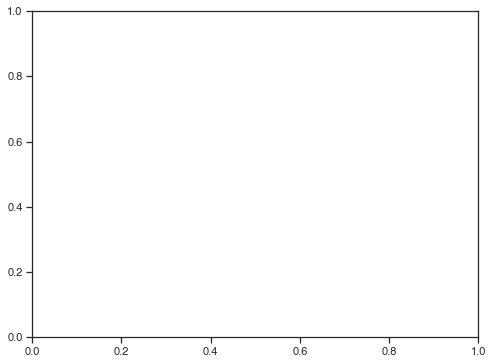

In [187]:

fig, ax = plt.subplots(figsize=(8, 6))

categories = list(anomalous_edges_distribution.keys())
desired_order = ['POOR', 'AVERAGE', 'RICH']
 
categories.sort(key=lambda x: desired_order.index(x))

labels = list(anomalous_edges_distribution[categories[0]].keys())

values_anomalous = calculate_percentages(np.array([[anomalous_edges_distribution[category][label] for label in labels] for category in categories]))
values_regular = calculate_percentages(np.array([[regular_edges_distribution[category][label] for label in labels] for category in categories]))

width = 0.3
bar_width = width / 2

# Use a common color palette for both anomalous and regular
colors_pal = sns.color_palette('tab20')
color_bar = [colors_pal[0], colors_pal[2], colors_pal[4], colors_pal[6]]

ax.set_xticks(np.arange(len(categories)) )
ax.set_xticklabels(categories, fontsize=16)

bottom_anomalous = np.zeros(len(categories))
bottom_regular = np.zeros(len(categories))
ax.set_ylim([0, 110])  # Adjust the range as needed

for i, label in enumerate(labels): 
    print(i,label)
    anomalous_color = color_bar[i % len(color_bar)]  # Repeating colors if there are more labels than colors
    # regular_color = color_bar[i % len(color_bar)]
    regular_color = color_bar_regular[i % len(color_bar)]
    
    ax.bar(np.arange(len(categories)) - bar_width / 2, values_anomalous[:, i], bar_width, label=f'{label}', color=anomalous_color, bottom=bottom_anomalous)
    bottom_anomalous += values_anomalous[:, i]
    
    ax.bar(np.arange(len(categories)) + bar_width / 2, values_regular[:, i], bar_width, color=regular_color, bottom=bottom_regular)
    bottom_regular += values_regular[:, i]

handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper left', bbox_to_anchor=(0.55, 0.8), frameon=False, fontsize=16)  # Adjusted bbox_to_anchor values

ax.set_xlabel('Weight Category', fontweight='bold', fontsize=16)
ax.set_ylabel('Percentage of Edges', fontweight='bold', fontsize=16)
# fig.suptitle('Percentage of Edges Distribution by Weight Categories', fontsize=16, fontweight='bold')
# plt.tight_layout() 
# plt.savefig('../../figures/Transfermarket_K08_counts.png', dpi=350, bbox_inches='tight')

plt.show()


In [ ]:
# plt.savefig('../../figures/Transfermarket_K08_counts.png', dpi=350, bbox_inches='tight')

In [188]:
sns.set()
data = []
for source_category in anomalous_edges_distribution:
    for target_category, count in anomalous_edges_distribution[source_category].items():
        data.append({'Source': source_category, 'Target': target_category, 'Count': count})

df = pd.DataFrame(data)
heatmap_data = df.pivot_table(index='Source', columns='Target', values='Count', aggfunc='sum')
# Normalize the dataframes
normalized_heatmap_data = heatmap_data / heatmap_data.sum().max()
# normalized_heatmap_data = heatmap_data.div(heatmap_data.sum(axis=1), axis=0)
# normalized_heatmap_data = heatmap_data.div(heatmap_data.sum(axis=0), axis=1) 
normalized_heatmap_data = normalized_heatmap_data.round(2)

vmax = 0.6

fig, axes = plt.subplots(1, 2, figsize=(16, 6)) 
sns.heatmap(normalized_heatmap_data, annot=False, fmt=".2f", cmap='Reds', cbar_kws={'label': 'Count of Anomalous Edges'}, vmin=0, vmax=vmax, linewidth=.5, ax=axes[0])
for i in range(len(normalized_heatmap_data.index)):
    for j in range(len(normalized_heatmap_data.columns)):
        axes[0].text(j + 0.5, i + 0.5, normalized_heatmap_data.iloc[i, j], ha='center', va='center', color='black', fontsize=16)

axes[0].set_xlabel('Target Category', fontweight='bold')
axes[0].set_ylabel('Source Category', fontweight='bold')


data_reg = []
for source_category in regular_edges_distribution:
    for target_category, count in regular_edges_distribution[source_category].items():
        data_reg.append({'Source': source_category, 'Target': target_category, 'Count': count})

df_reg = pd.DataFrame(data_reg)
heatmap_data_reg = df_reg.pivot_table(index='Source', columns='Target', values='Count', aggfunc='sum')
normalized_heatmap_data_reg = heatmap_data_reg / heatmap_data_reg.sum().max() 
# normalized_heatmap_data_reg = heatmap_data_reg.div(heatmap_data_reg.sum(axis=1), axis=0)
# normalized_heatmap_data_reg = heatmap_data_reg.div(heatmap_data_reg.sum(axis=0), axis=1)
normalized_heatmap_data_reg = normalized_heatmap_data_reg.round(2)

sns.heatmap(normalized_heatmap_data_reg, annot=False, fmt=".2f", cmap='Reds', cbar_kws={'label': 'Count of Regular Edges'}, vmin=0, vmax=vmax, linewidth=.5, ax=axes[1])

for i in range(len(normalized_heatmap_data_reg.index)):
    for j in range(len(normalized_heatmap_data_reg.columns)):
        axes[1].text(j + 0.5, i + 0.5, normalized_heatmap_data_reg.iloc[i, j], ha='center', va='center', color='black', fontsize=16)
axes[1].set_xlabel('Target Category', fontweight='bold')
axes[1].set_ylabel(' ')

# fig.suptitle('Edges Distribution by Weight Categories', fontweight='bold')

# plt.savefig('../../figures/Transfermarket_K08_heatmap.png', dpi=350)
plt.tight_layout()  
plt.show()


KeyError: 'Count'

In [189]:
node_name_to_int_mapping = {node: idx for idx, node in enumerate(graph.nodes())}
for srcnd,trgnd in edge_Z_pr_lab:
    integer_representationS = node_name_to_int_mapping.get(srcnd, None) 
    integer_representationT = node_name_to_int_mapping.get(trgnd, None) 
#     if ((integer_representationS is not None) and (integer_representationT  is not None)): 
#         print(f"The community membership of ' {(srcnd, trgnd)} ' is {(np.argmax(u_an[integer_representationS]),np.argmax(u_an[integer_representationT]))}", {A_0[0].degree(srcnd)}, {A_0[0].degree(trgnd)})
#     else:
#         print(f"'{srcnd}' not found in the graph.")

NameError: name 'edge_Z_pr_lab' is not defined

# PLOTS

# Plot on the Map

### Save the dictionary to a file

### Load the dictionary to a file: clubs, cities, and coordinates

In [190]:
N_th , E_th = None, None
mult_size_factor = 0.0007
labels=False 
weighted=False
label= None

# Defining the level of details for nodes plot
if N_th is None:
    N_th = graph_Nth.number_of_nodes()  # number of nodes to plot
else:
    N_th = min(N_th, graph_Nth.number_of_nodes())

thetas_sorted = {'u': thetas['u'][sort][:N_th]}
sort = sorted(enumerate(list(graph_Nth.degree)), key=lambda x: x[1][1], reverse=True)
sort = np.array(list(zip(*sort))[0])
nodes_sub = np.array(graph_Nth.nodes())[sort]
nodes_sub = nodes_sub[:N_th]

node_size_new = [0.0001+((graph_Nth.degree[i]) * 7) for i in nodes_sub]

NameError: name 'graph_Nth' is not defined

In [295]:
def extract_bridge_properties(i, color, U, threshold=0.):
    groups = np.where(U[i] > threshold)[0]   
    wedge_sizes = U[i][groups]
    wedge_colors = [color[c] for c in groups]
    return wedge_sizes, wedge_colors


In [ ]:
!pip install contextily

In [195]:
map_colors

NameError: name 'map_colors' is not defined

In [47]:
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import contextily as ctx

def plotting_map(
    graph: nx.Graph,
    pos: dict,
    node_size_factor: float = 1.0,
    map_colors: dict = {0: '#C998D7', 1: '#85C98D', 2: '#F8C38A', 3: '#846C5B', 4:'#95CBC7', 5:'#F5D058',6:'#E74E4E', 7:'#CCA5A5', 8:'#6359BE', 9:'#E868B5'},
    U: np.ndarray = None,
    node_size: np.ndarray: None,
    alpha: float = 0.8,
    width: float = 0.75,
    nodelist: list = None,
    edgelist: list = None,
    edge_color: str = 'red',
    figsize: tuple = (15, 10),
    ax: plt.Axes = None,
    plot_map: bool = True,
    map_boundaries: tuple = (-15, 35, 37, 55)
):

    if ax is None:
        fig, ax = plt.subplots(figsize=figsize) 
    
    if nodelist is None:
        nodelist = list(graph.nodes())
    
    if edgelist is None:
        edgelist = list(graph.edges())
        
    if node_size is None:
        node_size = np.array([graph.degree[i] for i in nodelist])
        
    for j,k in enumerate(thetas_sorted):
        nx.draw_networkx_edges(graph, pos, edgelist=edgelist, width=width,alpha=alpha, node_size=0,
                            edge_color=edge_color, arrows=True, arrowsize=1,style='--', connectionstyle="arc3,rad=0.2")
        nx.draw_networkx(graph, pos, nodelist=nodelist, node_size=0, with_labels=False,
                        edgelist=[])
    if U is not None:
        for i, n in enumerate(graph.nodes()):
            if n in nodelist:
                wedge_sizes, wedge_colors = extract_bridge_properties(i, map_colors, U)
                if len(wedge_sizes) > 0:
                    _ = plt.pie(wedge_sizes, center=pos[n], colors=wedge_colors,
                                radius=(node_size[i]) * node_size_factor,normalize=True)
                    ax.axis("equal")
#     ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.CartoDB.Positron, zoom=5)
    if plot_map is True:
        # extent = (-15, 35, 37, 55)
    #     extent = (-25, 40, 15, 55)
    #     extent = (-10, 50, 30, 55)  # Adjusted extent for Western Europe
    #     extent = (-15, 35, 37, 55)  # Adjusted extent for Western Europe
        ax.axis(map_boundaries) 
        ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.CartoDB.Positron, zoom=8) 
    
    plt.axis('off') 
    plt.show()

plotting_map(result_df, pos = pos,mult_size_factor=0.0024)

SyntaxError: invalid syntax (1530853556.py, line 13)

In [308]:
selection = ['OpenStreetMap.Mapnik',
             'OpenTopoMap',
             'Stamen.Toner',
             'Stamen.TonerLite',
             'Stamen.Terrain',
             'Stamen.TerrainBackground',
             'Stamen.Watercolor',
             'NASAGIBS.ViirsEarthAtNight2012',
             'CartoDB.Positron',
             'CartoDB.Voyager'
            ]

# Plot Graph based on the club incomes (node size=income)

In [309]:
max_weights = {}

for graph in A_0:
    for node in graph.nodes(): 
        weight = input_meta_in_data[input_meta_in_data['Alter'] == node]['weight'].values[0]
        node_weight = weight * 1
        max_weights[node] = max(max_weights.get(node, 0), node_weight)

node_weight = [max_weights[node] for node in sorted(max_weights)]

# # Example usage
# print("Node weights:", node_weight)

In [310]:
models = ['DynACD','DynACD0'] 

graph = A_0[0]
colors = {'DynACD': {0: 'salmon', 1: '#66CDAA', 2: 'blue', 3: 'brown', 4: 'purple', 5: 'red', 6: 'green', 7: 'grey'}, 'DynACD0': {0: 'salmon', 1: '#66CDAA', 2: 'blue', 3: 'brown', 4: 'purple', 5: 'red', 6: 'green', 7: 'grey'}}


# pos = nx.kamada_kawai_layout(graph, scale=2)

edge_color = 'darkgrey'
node_color = '#3b8bc2ff'

In [311]:
u_dynacd    = DynACD.cv_functions.normalize_nonzero_membership(u_an)
u_dynacd0   = DynACD.cv_functions.normalize_nonzero_membership(u_an_0) 


thetas_u = {'DynACD': u_dynacd, 'DynACD0': u_dynacd0}

communities_u = {}
for m in models:
    communities_u[m] = np.argmax(thetas_u[m], axis=1)
    
v_dynacd    = DynACD.cv_functions.normalize_nonzero_membership(v_an)
v_dynacd0   = DynACD.cv_functions.normalize_nonzero_membership(v_an_0) 


thetas_v = {'DynACD': v_dynacd, 'DynACD0': v_dynacd0}


communities_v = {}
for m in models:
    communities_v[m] = np.argmax(thetas_v[m], axis=1)

In [312]:
def plot_soft(model, graph, thetas, pos, node_weight, colors, edge_color, label):
    plt.figure(figsize=(12, 8))
    plt.subplot(1, 1, 1)  # Single panel

    nx.draw_networkx_edges(graph, pos=pos, width=0.1, edge_color=edge_color, arrows=True,
                           arrowsize=8, connectionstyle="arc3,rad=0.2", alpha=0.5)

    nx.draw_networkx_edges(graph,pos=pos,width=0.5,arrows=True,style='--',edgelist=unique_edge_list
                           ,arrowsize=10,edge_color='red',alpha=0.99, connectionstyle="arc3,rad=0.2")

    ax = plt.gca()
    for i, n in enumerate(graph.nodes()):
        
        wedge_sizes, wedge_colors = extract_bridge_properties(i, colors[model], thetas[model])  # unique_set
        if len(wedge_sizes) > 0:
            if node_weight[i] > 0:
                if i in unique_set: 
                    pie, t = plt.pie(wedge_sizes, center=pos[n]+rdm.uniform(0,0.1), colors=wedge_colors, radius=(node_weight[i]) * 0.00052)
                else:  
                    pie, t = plt.pie(wedge_sizes, center=pos[n], colors=wedge_colors, radius=(node_weight[i]) * 0.00052)
                ax.axis("equal")

    plt.title(model, fontsize=20)
    plt.axis('off')
    plt.tight_layout()
    plt.savefig(f'../figures/{label}', facecolor='white', edgecolor='none', dpi=400)
    plt.show()


In [313]:
pos['Manchester_City']

(-2.2446, 53.4839)

In [314]:
def plot_soft(model, graph, thetas, pos, node_weight, colors, edge_color, label):
    plt.figure(figsize=(14, 8))
    plt.subplot(1, 1, 1)  # Single panel

    nx.draw_networkx_edges(graph, pos=pos, width=0.1, edge_color=edge_color, arrows=True,
                           arrowsize=8, connectionstyle="arc3,rad=0.2", alpha=0.5)

    nx.draw_networkx_edges(graph, pos=pos, width=0.5, arrows=True, style='--', edgelist=unique_edge_list,
                           arrowsize=10, edge_color='red', alpha=0.99, connectionstyle="arc3,rad=0.2")

    ax = plt.gca()
    for i, n in enumerate(graph.nodes()): 
        
        wedge_sizes, wedge_colors = extract_bridge_properties(i, colors[model], thetas[model])  # unique_set + rdm.uniform(0, 0.1)
        if len(wedge_sizes) > 0:
            if node_weight[i] > 0:
                
                if n == 'Manchester_City': 
                    pos_mod = (pos[n][0]+ 1.5, pos[n][1] + 1.5)
                    pie, t = plt.pie(wedge_sizes, center=pos_mod , colors=wedge_colors,
                                     radius=(node_weight[i]) * 0.00052)
                    
                    # Add node label
                    plt.text(pos[n][0], pos[n][1], str(n), ha='center', va='center', fontweight='light', fontsize=2,
                             bbox=dict(boxstyle='round', facecolor='none', edgecolor='none', alpha=0.3))
                elif (n in unique_set) and (n != 'Manchester_City'): 
                    pos_mod = (pos[n][0]+ rdm.uniform(0.1, 0.2), pos[n][1]- rdm.uniform(0.1,0.2))
                    pie, t = plt.pie(wedge_sizes, center=pos_mod , colors=wedge_colors,
                                     radius=(node_weight[i]) * 0.00052)

                    # Add node label
                    plt.text(pos[n][0], pos[n][1], str(n), ha='center', va='center', fontweight='light', fontsize=2,
                             bbox=dict(boxstyle='round', facecolor='none', edgecolor='none', alpha=0.3))
                else:
                    pie, t = plt.pie(wedge_sizes, center=pos[n], colors=wedge_colors, radius=(node_weight[i]) * 0.00052)
                ax.axis("equal")

    plt.title(model, fontsize=20)
    plt.axis('off')
    plt.tight_layout()
    plt.savefig(f'../figures/{label}', facecolor='white', edgecolor='none', dpi=600)
    plt.show()


adjacency_2008_23_len_community_soft_u_DynACD_IN-WEIGHT.png


<IPython.core.display.Javascript object>


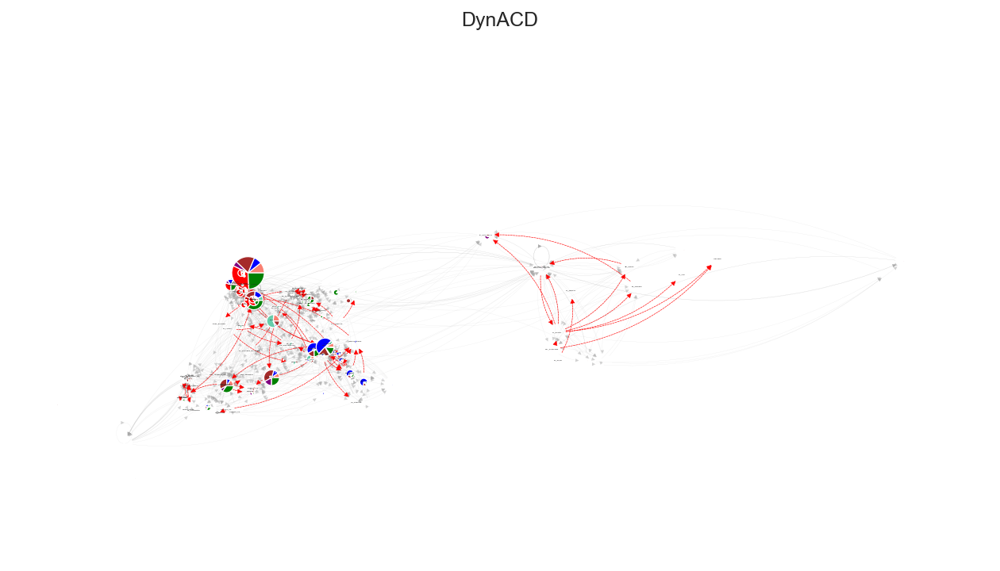

In [261]:
label = f'{dataset}_community_soft_u_DynACD_IN-WEIGHT.png'
print(label)
plot_soft(models[0], graph, thetas_u, pos, node_weight, colors, edge_color, label) 

# Plot Graph based on the node degree (node size=degree)

In [243]:
max_degrees = {}

for graph in A_0: 
    for node in graph.nodes():  
        degree = graph.degree[node] * 30
        max_degrees[node] = max(max_degrees.get(node, 0), degree) 

node_size = [max_degrees[node] for node in sorted(max_degrees)] 

In [191]:
A_0

In [244]:
models = ['DynACD','DynACD0'] 

graph = A_0[0]
# node_size = [graph.degree[i]*10 for i in list(graph.nodes())]
colors = {'DynACD': {0: 'salmon', 1: '#66CDAA', 2: 'blue', 3: 'brown', 4: 'purple', 5: 'red', 6: 'green', 7: 'grey'}, 'DynACD0': {0: 'salmon', 1: '#66CDAA', 2: 'blue', 3: 'brown', 4: 'purple', 5: 'red', 6: 'green', 7: 'grey'}}


# pos = nx.kamada_kawai_layout(graph, scale=2)

edge_color = 'darkgrey'
node_color = '#3b8bc2ff'

In [245]:
u_dynacd    = DynACD.cv_functions.normalize_nonzero_membership(u_an)
u_dynacd0   = DynACD.cv_functions.normalize_nonzero_membership(u_an_0) 


thetas_u = {'DynACD': u_dynacd, 'DynACD0': u_dynacd0}

communities_u = {}
for m in models:
    communities_u[m] = np.argmax(thetas_u[m], axis=1)
    
v_dynacd    = DynACD.cv_functions.normalize_nonzero_membership(v_an)
v_dynacd0   = DynACD.cv_functions.normalize_nonzero_membership(v_an_0) 


thetas_v = {'DynACD': v_dynacd, 'DynACD0': v_dynacd0}


communities_v = {}
for m in models:
    communities_v[m] = np.argmax(thetas_v[m], axis=1)

In [246]:
def plot_soft(model, graph, thetas, pos, node_size, colors, edge_color, label):
    plt.figure(figsize=(16, 10))
    plt.subplot(1, 1, 1)  # Single panel

    nx.draw_networkx_edges(graph, pos=pos, width=0.1, edge_color=edge_color, arrows=True,
                           arrowsize=8, connectionstyle="arc3,rad=0.2", alpha=0.5)

    nx.draw_networkx_edges(graph,pos=pos,width=0.5,arrows=True,style='--',edgelist=unique_edge_list
                           ,arrowsize=10,edge_color='red',alpha=0.99, connectionstyle="arc3,rad=0.2")

    ax = plt.gca()
    for i, n in enumerate(graph.nodes()):
        
        wedge_sizes, wedge_colors = extract_bridge_properties(i, colors[model], thetas[model])
        
        if len(wedge_sizes) > 0:
            if node_size[i] > 0:
                
                if n in unique_set: 
                    pos_mod = (pos[n][0]+ rdm.uniform(0.1, 0.2), pos[n][1]- rdm.uniform(0.1,0.2))
                    pie, t = plt.pie(wedge_sizes, center=pos_mod , colors=wedge_colors,
                                     radius=(node_weight[i]) * 0.00052)

                    # Add node label
                    plt.text(pos[n][0], pos[n][1], str(n), ha='center', va='center', fontweight='light', fontsize=2,
                             bbox=dict(boxstyle='round', facecolor='none', edgecolor='none', alpha=0.3))
                    
                pie, t = plt.pie(wedge_sizes, center=pos[n], colors=wedge_colors, radius=(node_size[i]) * 0.0005)
                ax.axis("equal")

    plt.title(model, fontsize=20)
    plt.axis('off')
    plt.tight_layout()
    plt.savefig(f'../figures/{label}', facecolor='white', edgecolor='none', dpi=600)
    plt.show()


adjacency_2008_23_len_community_soft_u_DynACD.png


<IPython.core.display.Javascript object>


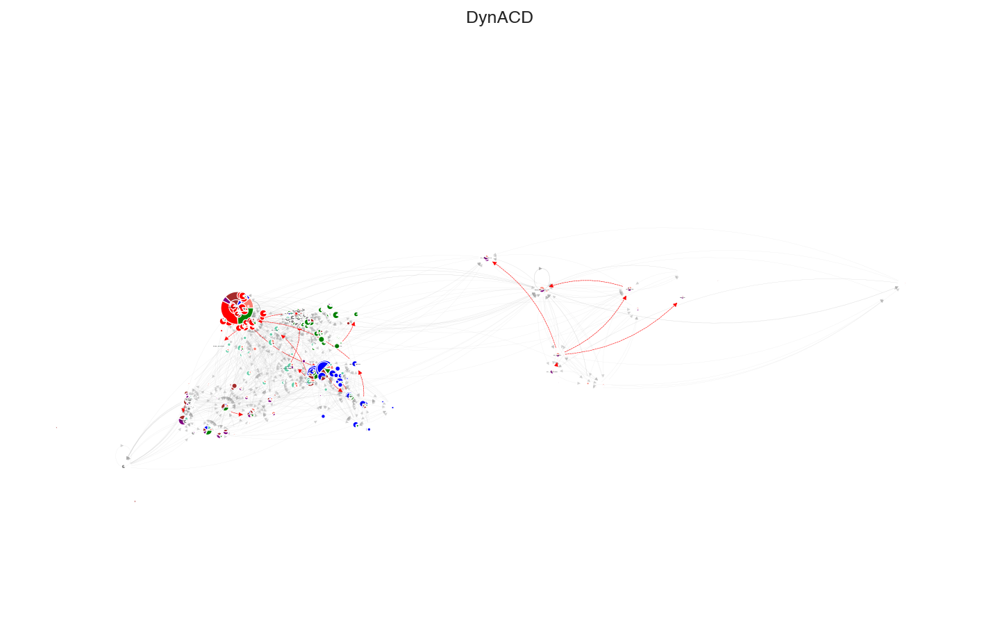

In [247]:
label = f'{dataset}_community_soft_u_DynACD.png'
print(label)
plot_soft(models[0], graph, thetas_u, pos, node_size, colors, edge_color, label) 

In [263]:
def extract_bridge_properties(i, color, U, threshold=0.):
    groups = np.where(U[i] > threshold)[0] 
    wedge_sizes = U[i][groups]
    wedge_colors = [color[c] for c in groups]
    return wedge_sizes, wedge_colors

def plot_soft(models, graph, thetas, pos, node_size, colors, edge_color, label):
    plt.figure(figsize=(30,15))
    for j, p in enumerate(models): 
        plt.subplot(1,2,j+1) 
        nx.draw_networkx_edges(graph,pos=pos,width=0.15,edge_color=edge_color,arrows=True,
                               arrowsize=10, connectionstyle="arc3,rad=0.2",alpha=0.65) 
        if p == 'DynACD0':
            nx.draw_networkx_edges(graph,pos=pos,width=0.2,arrows=True,style='--'
                                   ,arrowsize=5,edge_color='silver',alpha=0.65, connectionstyle="arc3,rad=0.2") #,edgelist=unique_edge_list
        elif p == 'DynACD':
            nx.draw_networkx_edges(graph,pos=pos,width=2,arrows=True,style='--',edgelist=unique_edge_list
                                   ,arrowsize=15,edge_color='red',alpha=0.9, connectionstyle="arc3,rad=0.2")
                       
        ax = plt.gca()
        for i, n in enumerate(graph.nodes()):
            wedge_sizes,wedge_colors = extract_bridge_properties(i,colors[p],thetas[p])
            if len(wedge_sizes)>0:
                if node_size[i] > 0:
                    pie,t = plt.pie(wedge_sizes, center=pos[n], colors = wedge_colors,radius=(node_size[i])*0.00045)
                    ax.axis("equal")
        plt.title(models[j], fontsize=20)
        plt.axis('off')
    plt.tight_layout()
#     plt.savefig(f'../figures/{label}', facecolor='white', edgecolor='none', dpi=300)
    plt.show()

adjacency_2008_23_len_community_soft_u.png


<IPython.core.display.Javascript object>


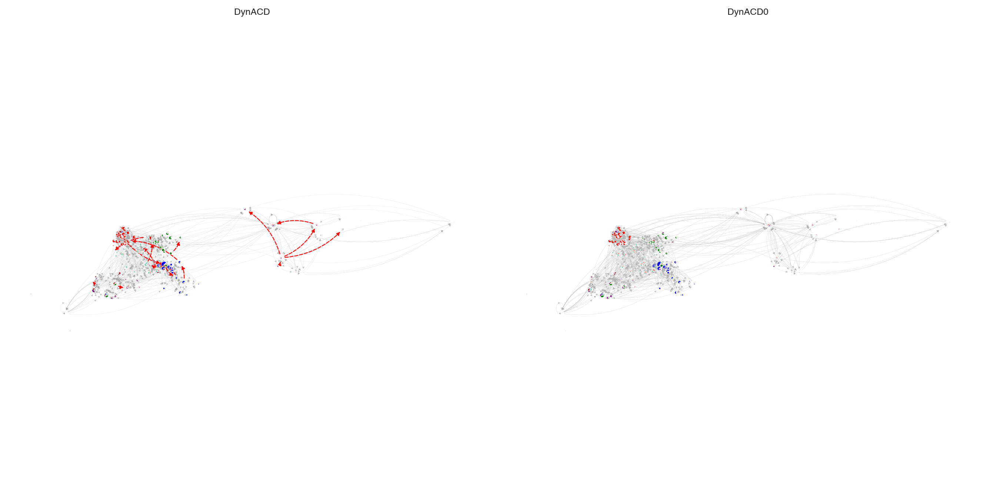

In [264]:
label = f'{dataset}_community_soft_u.png'
print(label)
plot_soft(models, graph, thetas_u, pos, node_size, colors, edge_color, label) 

# PLOT ANOMALOUS GRAPH

In [196]:
G_anomalous = nx.Graph()

for node in inf_node_list:
    if node == 'Suderland':
        node = 'Sunderland'
    node_data = graph_Nth.nodes[node]
    G_anomalous.add_node(node, **node_data)

for edge in edge_Z_pr_lab: 
    G_anomalous.add_edge(edge[0], edge[1])

NameError: name 'graph_Nth' is not defined

In [157]:
pos_anomalous=nx.spring_layout(G_anomalous)
pos_anomalous=nx.random_layout(G_anomalous, seed =1669)
pos_anomalous=nx.kamada_kawai_layout(G_anomalous)

In [263]:
for node in G_anomalous.nodes:
    if node == 'Suderland':
        node = 'Sunderland'
    original_node_index = list(graph_Nth.nodes).index(node)
    community_membership = u_an[original_node_index]
    G_anomalous.nodes[node]['community_membership'] = community_membership


In [264]:
num_nodes = len(G_anomalous.nodes)
num_communities = len(G_anomalous.nodes[next(iter(G_anomalous.nodes))]['community_membership'])

u_anomalous = np.zeros((num_nodes, num_communities))
for i, node in enumerate(G_anomalous.nodes):
    if node == 'Suderland':
        node = 'Sunderland'
    community_membership = G_anomalous.nodes[node]['community_membership']
    u_anomalous[i, :] = community_membership

In [265]:
u_anomalous_max=np.argmax(u_anomalous,1)

In [266]:
G_anomalous_pos = {node: pos[node] for node in G_anomalous.nodes()} 

In [267]:
# pos_anomalous=nx.spring_layout(G_anomalous)
# pos_anomalous=nx.random_layout(G_anomalous, seed =1669)
# pos_anomalous=nx.kamada_kawai_layout(G_anomalous)

<IPython.core.display.Javascript object>


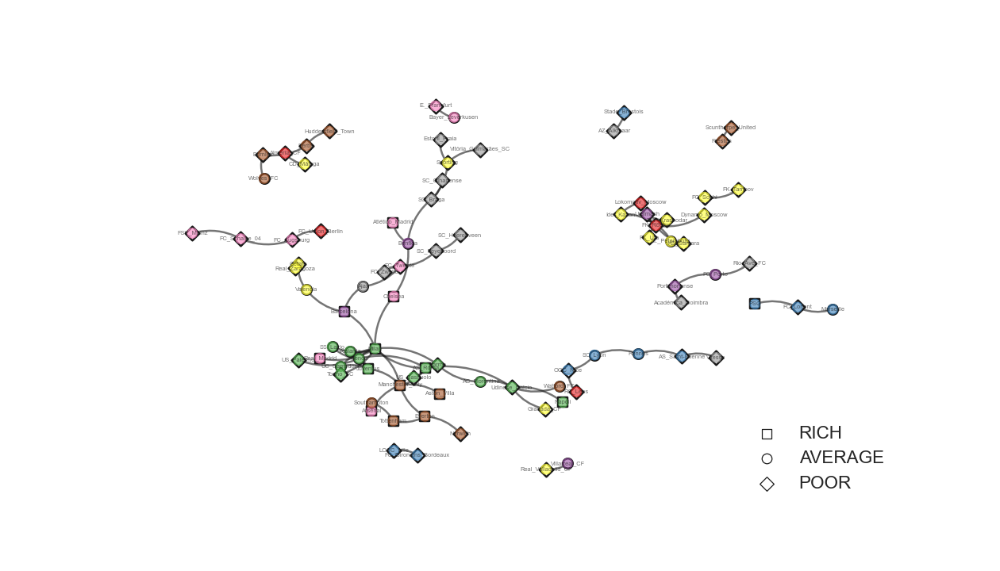

In [289]:
# fig, ax = plt.subplots(figsize=(15, 10)) 
G_anomalous_pos = nx.spring_layout(G_anomalous, seed=10, iterations=25)

cmap = plt.cm.Dark2
cmap = plt.cm.Set1 
nd_size = 100

if 'Suderland' in list(G_anomalous.nodes()):
    G_anomalous.remove_node('Suderland')

# pos = pos.pop('Suderland')

for node, data in G_anomalous.nodes(data=True):
    if data['weight'] > heavy_threshold:
        data['weight_category'] = 'RICH'
    elif data['weight'] >= average_threshold:
        data['weight_category'] = 'AVERAGE'
    else:
        data['weight_category'] = 'POOR'

node_shapes = {
    'RICH': 's',  
    'AVERAGE': 'o',  
    'POOR': 'D'  
}

plt.figure(figsize=(14, 8))
for category in node_shapes:
    category_nodes = [node for node, data in G_anomalous.nodes(data=True) if data['weight_category'] == category]
    nx.draw_networkx_nodes(G_anomalous, pos=G_anomalous_pos, node_shape=node_shapes[category], nodelist=category_nodes,cmap = cmap, node_size=nd_size,node_color='white', edgecolors= 'k', linewidths=2)  

nx.draw_networkx(G_anomalous, pos=G_anomalous_pos,cmap = cmap, arrows=True,node_size=nd_size,node_color=u_anomalous_max, connectionstyle="arc3,rad=0.2",arrowsize=15, width=2,with_labels=True, alpha=0.6,font_size=6)   

for category in node_shapes: 
    plt.scatter([], [], label=category, marker=node_shapes[category], s=nd_size)
legend_handles = [plt.scatter([], [], label=category, marker=node_shapes[category], s=nd_size, color='white', edgecolor='k')
                  for category in node_shapes]

plt.legend(handles=legend_handles, scatterpoints=1, frameon=False, loc='lower right', fontsize=18) 

plt.axis('off')
plt.savefig(f'../../figures/adjacency_2008_23_len_community_wealth', facecolor='white', edgecolor='none', dpi=600)
plt.show()



# PLOT DISTRIBUTION vs WEALTH:

In [272]:
Q_lab     = ['Anomalous' if edgs in unique_edge_list else 'Regular' for edgs in list(graph_Nth.edges())] 

In [273]:
df_dict = {}
# df_dict = {'edg':[],'theta':[], 'Q':[], 'inferred':[], 'True Label':[]}  
df_dict['edges']   = [edgs for idx,edgs in  enumerate(graph_Nth.edges())] 

df_dict['Inferred'] = Q_lab 

In [274]:
df_dict['Ego_w']     = [graph_Nth.nodes[edgs[0]]['weight'] for idx,edgs in  enumerate(graph_Nth.edges())] 
df_dict['Alter_w']   = [graph_Nth.nodes[edgs[1]]['weight'] for idx,edgs in  enumerate(graph_Nth.edges())] 


In [275]:
reliabilities_df = pd.DataFrame()
reliabilities_df = pd.DataFrame(df_dict)
reliabilities_df.head(n=-2)

,edges,Inferred,Ego_w,Alter_w
0,"(AC_Fiorentina, Hellas_Verona)",Regular,574,168
1,"(AC_Fiorentina, Juventus)",Regular,574,1755
2,"(AC_Fiorentina, FC_Nantes)",Regular,574,104
3,"(AC_Fiorentina, Cagliari_Calcio)",Regular,574,224
4,"(AC_Fiorentina, AS_Roma)",Regular,574,1000
...,...,...,...,...
535,"(Wolfsburg, FC_Augsburg)",Regular,679,159
536,"(Wolfsburg, Fulham)",Regular,679,445
537,"(Wolves_FC, Burnley)",Regular,671,307
538,"(Wolves_FC, Birmingham)",Regular,671,141


<IPython.core.display.Javascript object>


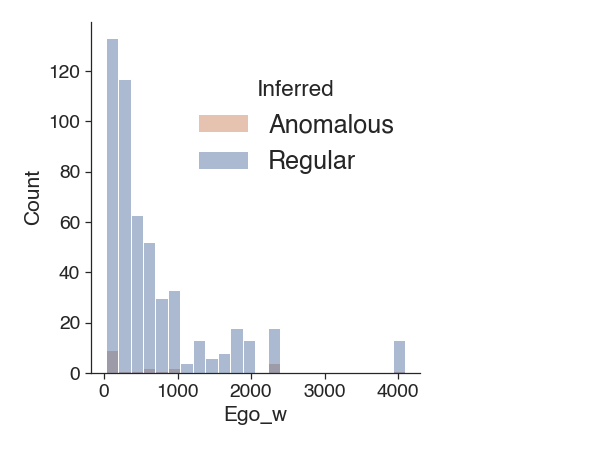

In [276]:
import seaborn as sns
sns.set_style("white", {'axes.grid' : False})
sns.set_context("paper", font_scale=1.75, rc={"lines.linewidth": 6} )
sns.set_palette("deep", 8, .75) 
sns.set_style('ticks') 

# sns.displot(reliabilities_df, x="Q", hue="True Label", kind="kde", multiple="stack")
g_dq = sns.displot(reliabilities_df, x="Ego_w", hue="Inferred", fill=True)#, kind="kde"
g_dq.legend.remove()
# g_dq.add_legend(title='True Label',label_order=["Regular","Anomalous"],frameon=False, bbox_to_anchor=(0.75, 0.8)) #loc='upper left' 
plt.legend(labels=["Anomalous","Regular"], title = "Inferred",frameon=False
           , bbox_to_anchor=(0.99, 0.9), 
           fontsize = 'large', title_fontsize = "18")
# g_dq.axes[0,0].set_xlim((-0.1,0.5))
# g_dq.axes[0,0].set_ylim((0,12))
# g_dq.savefig('../figures/vampire_bat_TL.png', dpi=300)


<IPython.core.display.Javascript object>


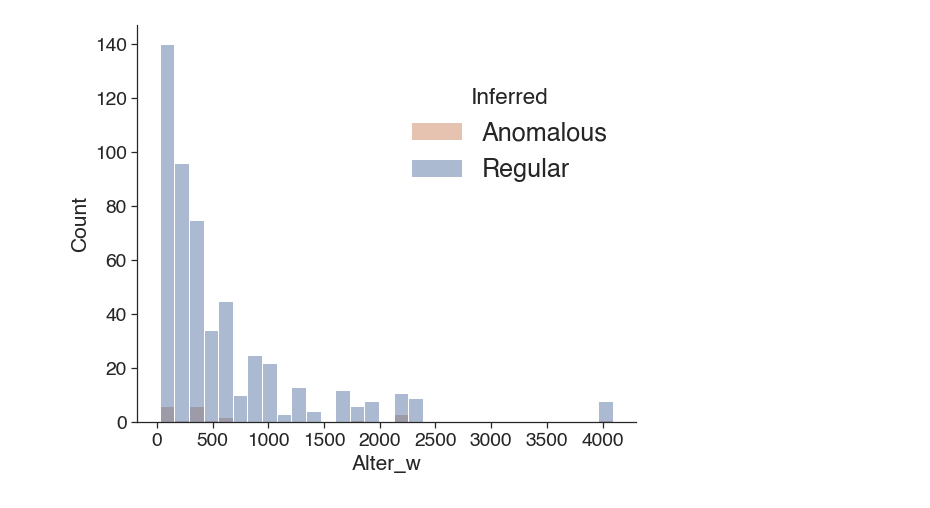

In [277]:
import seaborn as sns
sns.set_style("white", {'axes.grid' : False})
sns.set_context("paper", font_scale=1.75, rc={"lines.linewidth": 6} )
sns.set_palette("deep", 8, .75) 
sns.set_style('ticks') 

# sns.displot(reliabilities_df, x="Q", hue="True Label", kind="kde", multiple="stack")
g_dq = sns.displot(reliabilities_df, x="Alter_w", hue="Inferred")
g_dq.legend.remove()
# g_dq.add_legend(title='True Label',label_order=["Regular","Anomalous"],frameon=False, bbox_to_anchor=(0.75, 0.8)) #loc='upper left' 
plt.legend(labels=["Anomalous","Regular"], title = "Inferred",frameon=False
           , bbox_to_anchor=(0.99, 0.9), 
           fontsize = 'large', title_fontsize = "18")


/Users/hsafdari/opt/anaconda3/lib/python3.9/site-packages/seaborn/axisgrid.py:1274: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


<IPython.core.display.Javascript object>


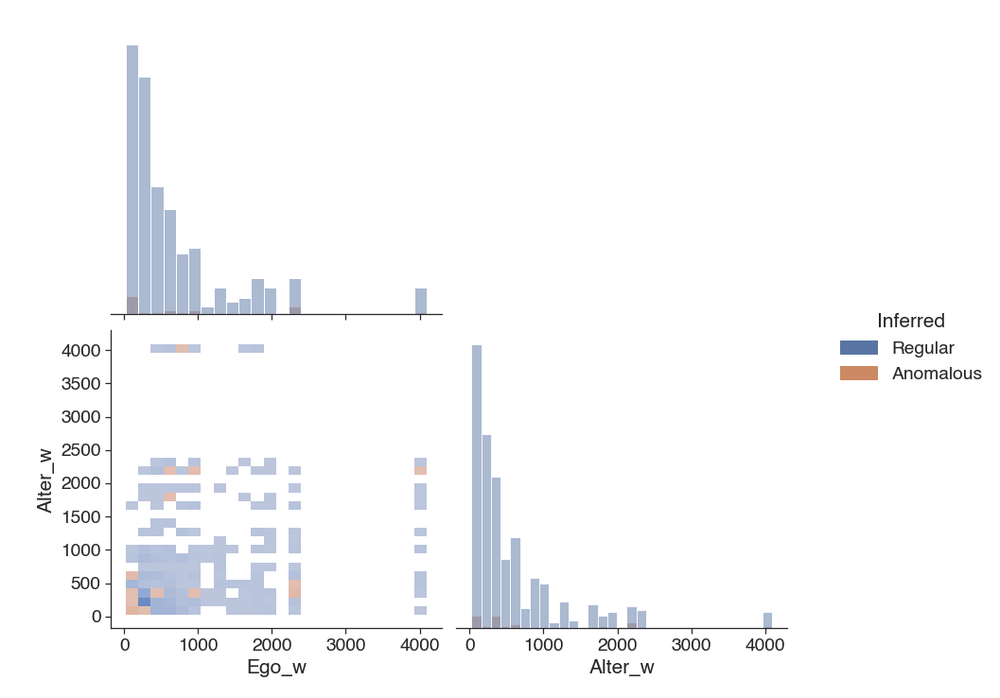

In [278]:
g = sns.pairplot(data=reliabilities_df, hue="Inferred", height=4, kind="hist", corner=True)#, kind="kde" 
# g.map_lower(sns.kdeplot, levels=4, color=".2")

<IPython.core.display.Javascript object>


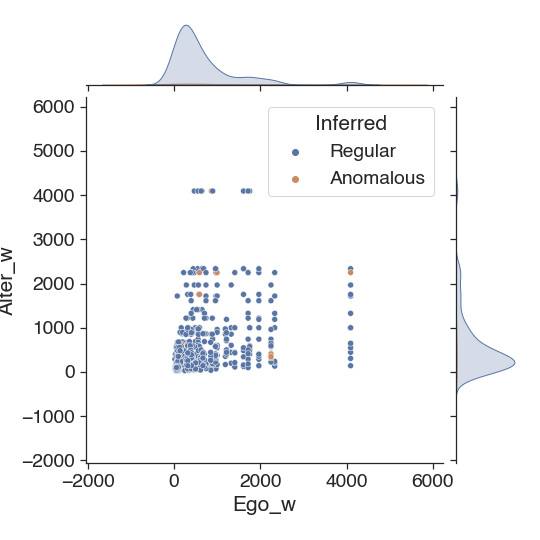

In [279]:
sns.jointplot(data=reliabilities_df, x="Ego_w", y="Alter_w", hue="Inferred")
